In [1]:
import sys
sys.path.insert(0, '../')
from NE204_Functions import *

Plots directory already exists


#### 29 is good

In [2]:
combine_data_files('Data/CLLBC/Cs137/', 'no-n', 'Data/CLLBC/Combined_Data/')

Combined 10 files of data


In [24]:
data_test, sat = import_data('/Users/raptor/Research/python3316/Data/Test-CLLBC-1118/CLLBC-Cs137-noterm-10sec_4.h5')
data_test_old, sat = import_data('/Users/raptor/Research/python3316/Data/Test-CLLBC-1118/CLLBC-Cs137-10sec_1.h5')

Checking for Saturation:   0%|          | 0/2150 [00:00<?, ?it/s]

Checking for Saturation:   0%|          | 0/1834 [00:00<?, ?it/s]

In [40]:
data_cs.shape

(4638, 500)

In [41]:
data_cs_new.shape

(12561, 500)

In [71]:
data, sat = import_data('/Users/raptor/Research/python3316/Data/Test-CLLBC-1118/CLLBC-Cf252-25cm-test-10sec_17.h5')

Checking for Saturation:   0%|          | 0/35328 [00:00<?, ?it/s]

In [2]:
data, sat = import_data('Data/CLLBC/Combined_Data/CLLBC-Cf252-25cm-6.h5')

Checking for Saturation:   0%|          | 0/193591 [00:00<?, ?it/s]

In [16]:
data2, sat2 = import_data('Data/CLLBC/Combined_Data/CLLBC-Cs137-25cm-no-n-10.h5')

Checking for Saturation:   0%|          | 0/102655 [00:00<?, ?it/s]

In [3]:
len(data)

193591

In [462]:
sat

[109195, 130450, 138828, 144183, 163163]

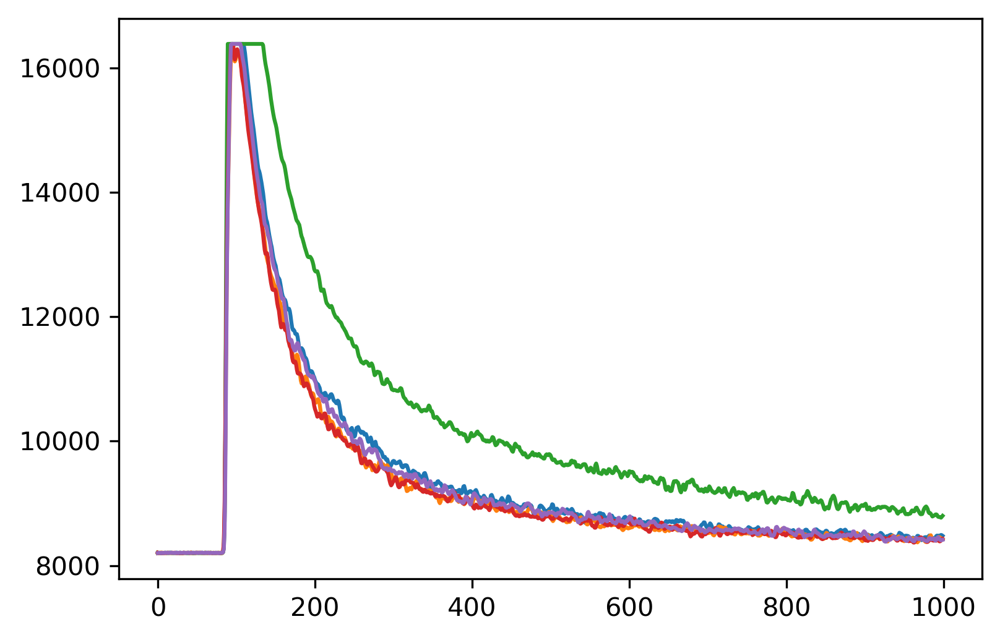

In [466]:
for i in sat:
    plt.plot(data[i])

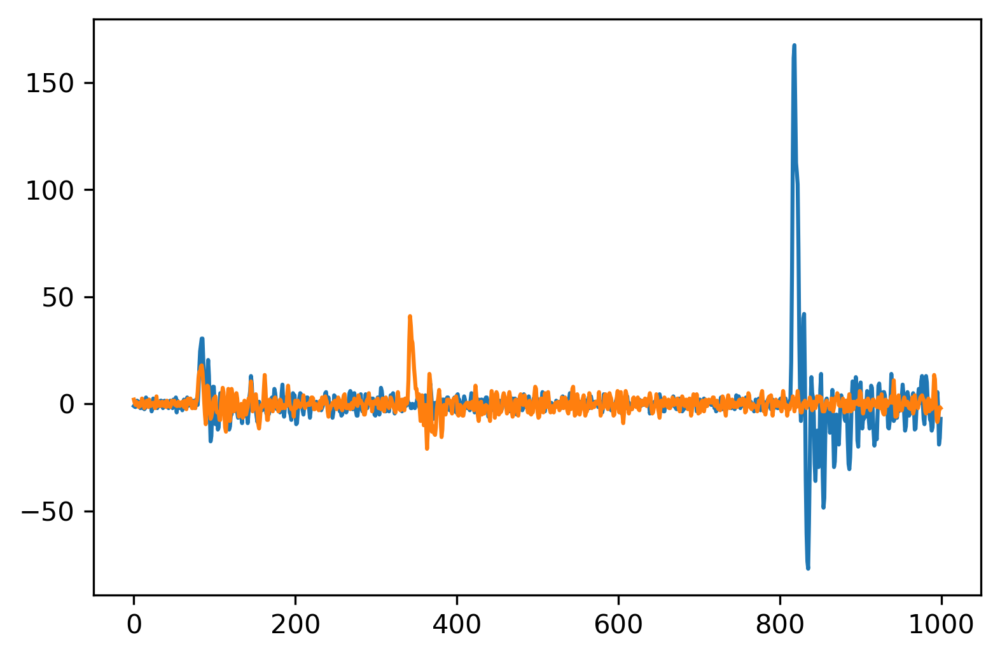

In [157]:
plt.plot(np.gradient(data[300]))
plt.plot(np.gradient(data[331]))

In [173]:
st = time.time()
temp = savgol_filter(reset_zero(data[331], samp_size=50), 27, 0)
print(time.time() - st)

st = time.time()
temp = MA(data[331], 27, samp_size=50)
print(time.time() - st)

0.0025746822357177734
0.0006928443908691406


In [189]:
find_peaks(simp_signal(data[331]), prominence=20)[0]

array([112, 372])

In [73]:
bad_pulses = []
for p, pulse in enumerate(tqdm(data)):
    if bad_signal_detector(pulse):
        bad_pulses.append(p)
bad_pulses = np.concatenate([np.array(bad_pulses), sat])

  0%|          | 0/193591 [00:00<?, ?it/s]

In [74]:
bad_pulses2 = []
for p, pulse in enumerate(tqdm(data2)):
    if bad_signal_detector(pulse):
        bad_pulses2.append(p)
bad_pulses2 = np.concatenate([np.array(bad_pulses2), sat2])

  0%|          | 0/102655 [00:00<?, ?it/s]

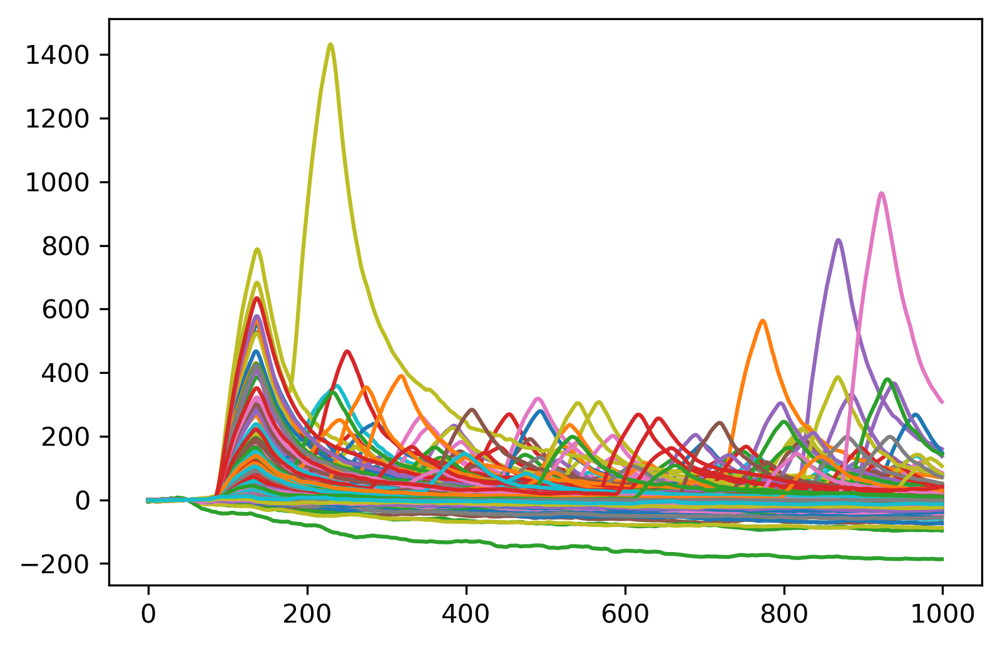

In [83]:
for i in range(500):
    plt.plot(simp_signal(data[bad_pulses[i]], 51))

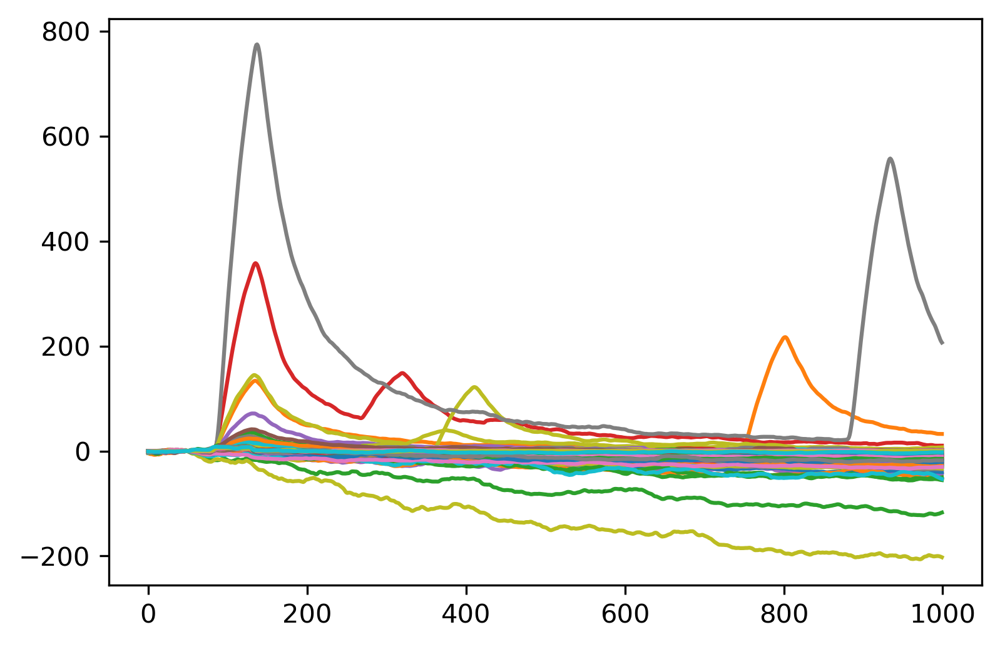

In [81]:
for i in range(200):
    plt.plot(simp_signal(data2[bad_pulses2[i]], 51))

In [24]:
len(bad_pulses)/len(data)

0.029929077281485195

In [23]:
len(bad_pulses2)/len(data2)

0.016842823048073646

In [60]:
300 in bad_pulses

False

In [66]:
bad_signal_detector(data[300], prom_frac=0.19)

False

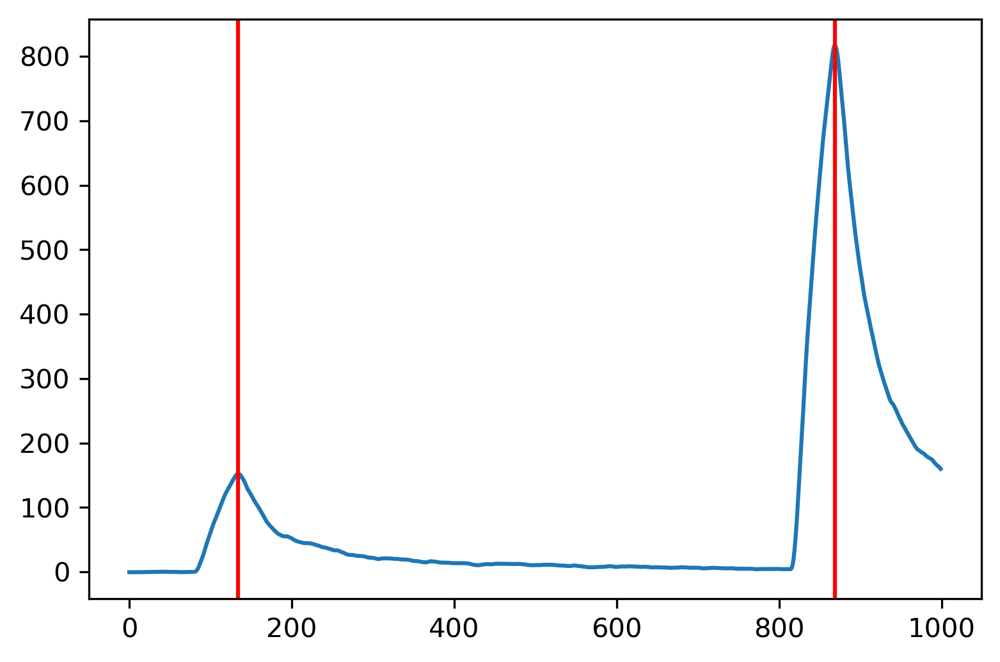

In [58]:
i = 11
plt.plot(simp_signal(data[300], 51))
temp = find_peaks(simp_signal(data[300], 51), 
                  prominence=np.max(simp_signal(data[300], 51))*0.1)
for p in temp[0]:
    plt.axvline(p, color='red')

In [469]:
sat

[109195, 130450, 138828, 144183, 163163]

In [488]:
len(bad_pulses)/len(data)

0.029929077281485195

In [480]:
plotted

30763

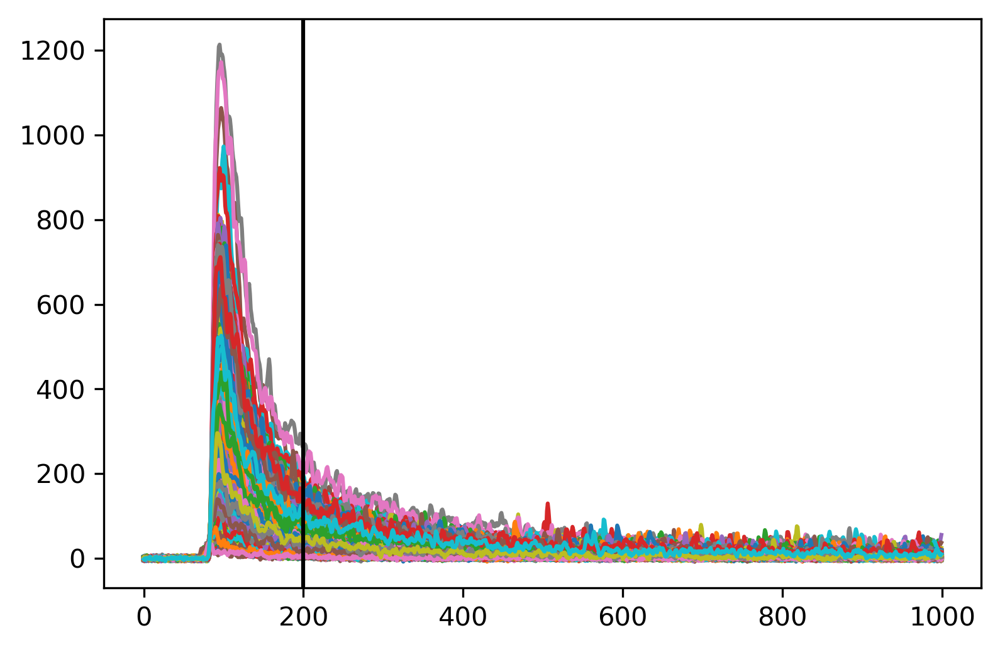

In [77]:
plotted = 0
for i in range(len(data2)):
    if plotted >= 500:
        break
    if i not in bad_pulses2 and np.max(data2[i]) < 9500:
        plt.plot(reset_zero(data2[i], samp_size=50))
        plotted += 1
plt.axvline(200, color='black')
plt.show()

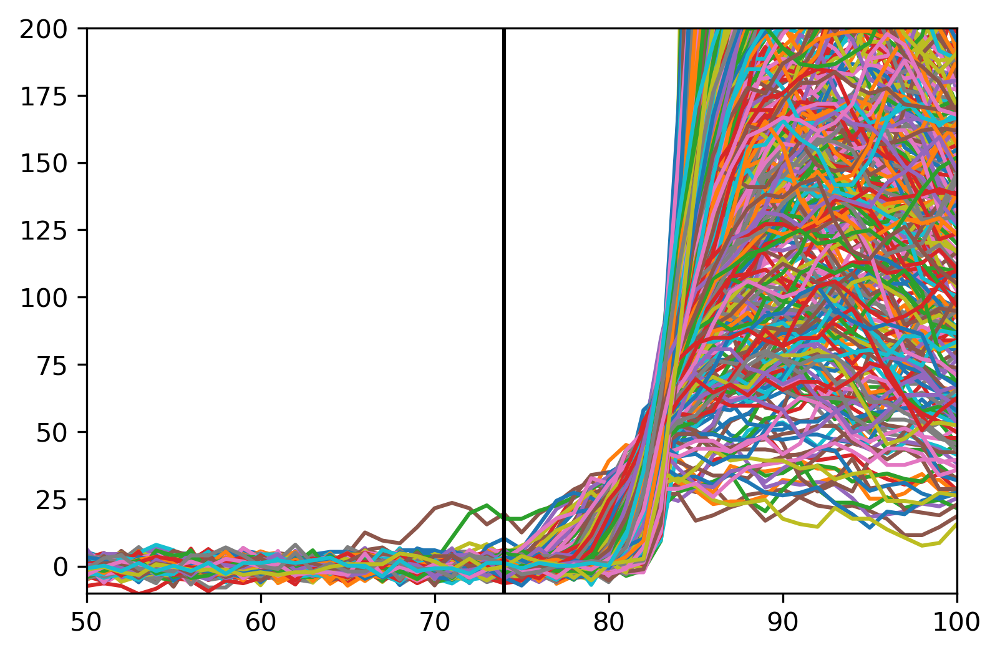

In [96]:
plotted = 0
for i in range(len(data)):
    if plotted >= 500:
        break
    if i not in bad_pulses: # and np.max(data[i]) < 9500:
        plt.plot(reset_zero(data[i], samp_size=50))
        plotted += 1
plt.xlim(50,100)
plt.ylim(-10,200)
plt.axvline(74, color='black')
plt.show()

In [47]:
start_tot = 74

In [57]:
test[-1]

300

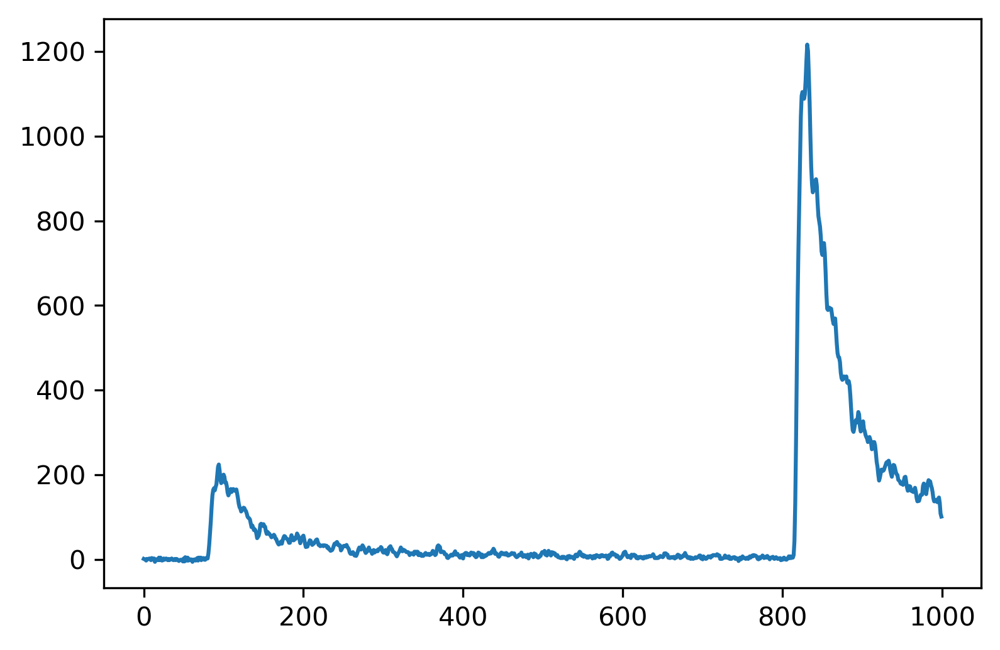

In [56]:
plt.plot(reset_zero(data[test[-1]], samp_size=50))

In [436]:
temp

(array([129, 832]),
 {'prominences': array([29.98039216,  3.33333333]),
  'left_bases': array([  9, 679]),
  'right_bases': array([914, 914])})

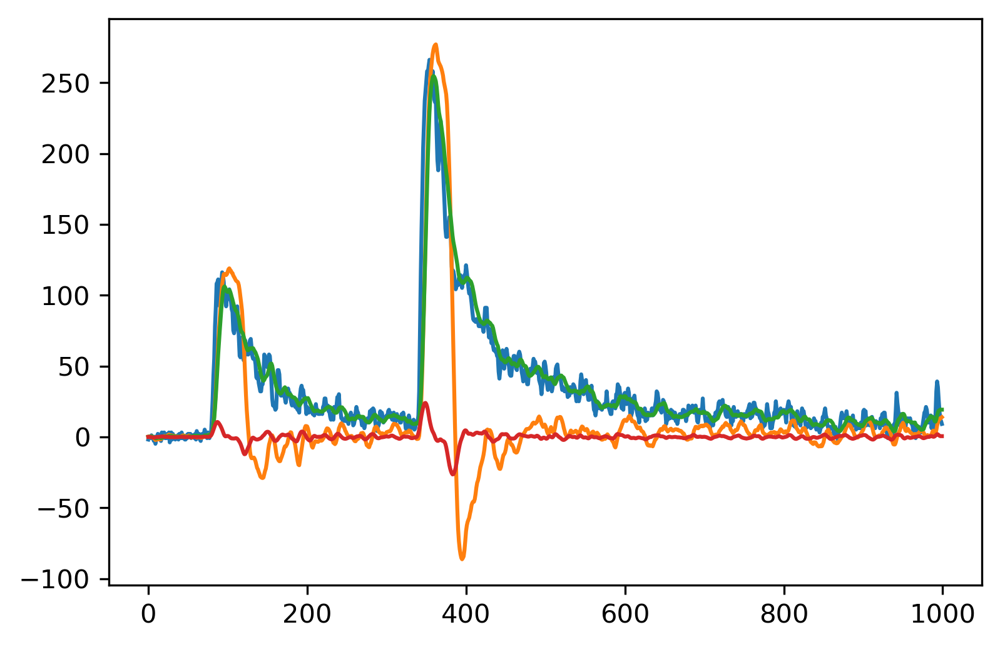

In [106]:
temp = reset_zero(data[331], samp_size=50)
p, g = 10, 25
plt.plot(temp)
plt.plot(trapezoid_filter(temp, p, g, 100, samp_size=50))
plt.plot(MA(temp, 11, samp_size=50))
plt.plot(savgol_filter(np.gradient(trapezoid_filter(temp, p, g, 100, samp_size=50)), 5, 0))

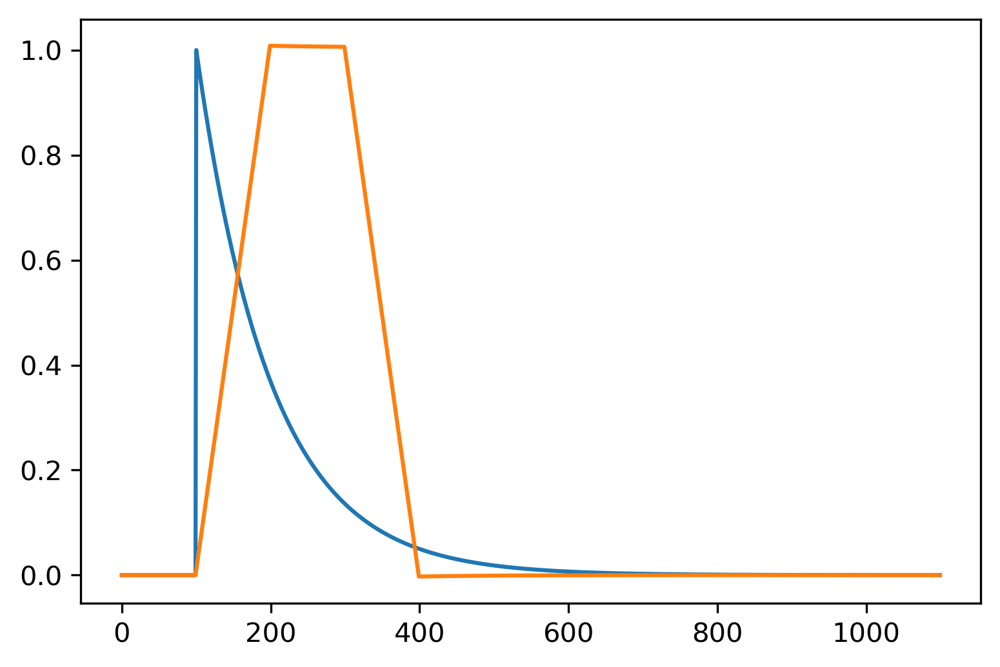

In [75]:
test_sig = np.concatenate([np.zeros(100), np.exp(-np.arange(1000)/100)])
plt.plot(test_sig)
plt.plot(trapezoid_filter(test_sig, 100, 100, 100, samp_size=50))

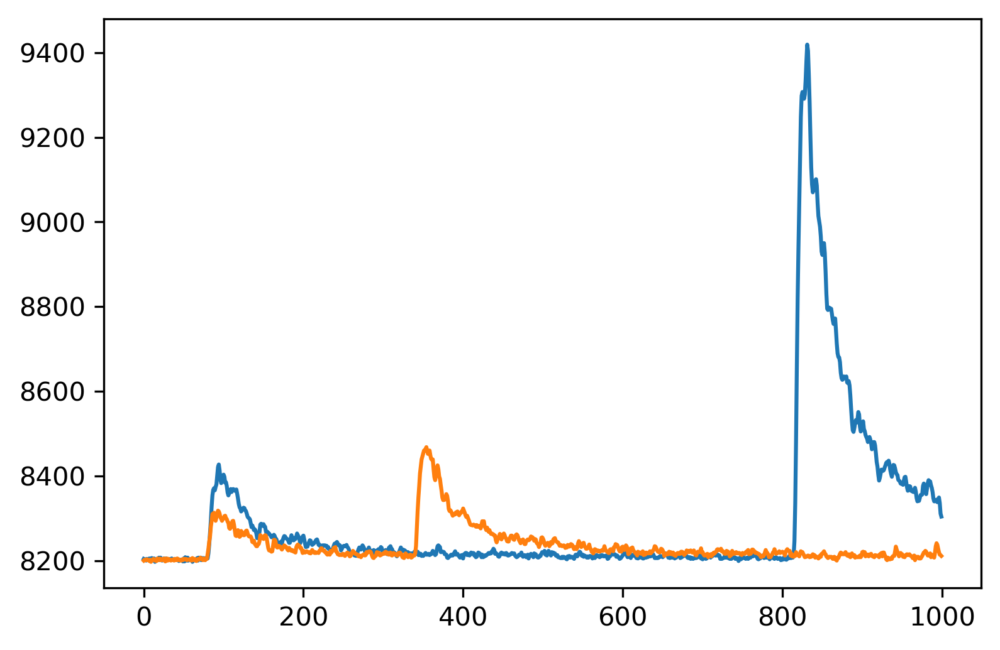

In [58]:
plt.plot(data[300])
plt.plot(data[331])

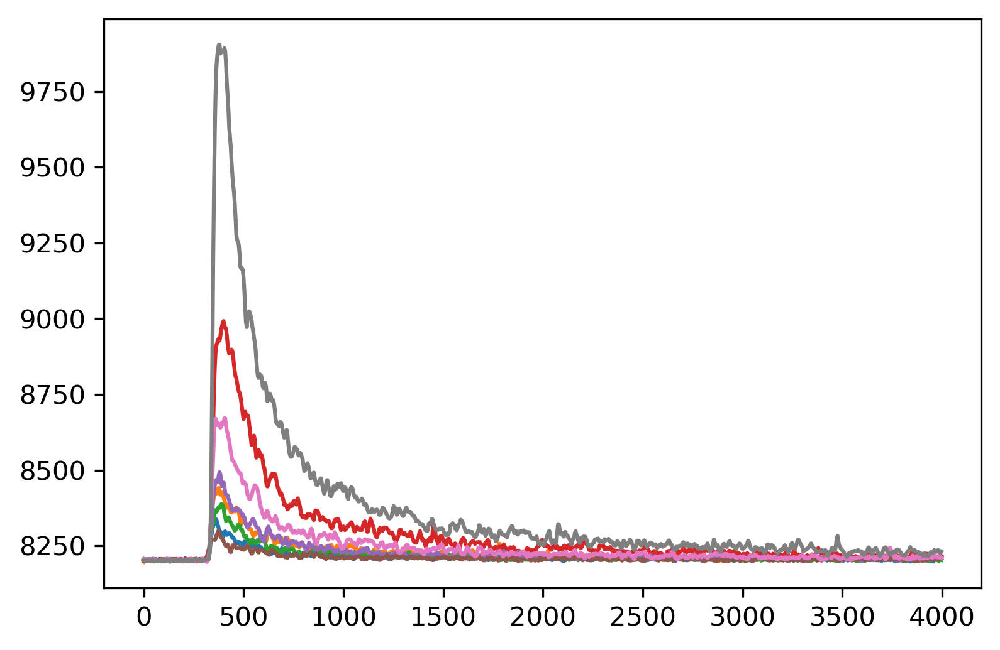

In [57]:
for i in range(331,340):
    plt.plot(np.arange(len(data[0]))*4, data[i])
#plt.xlim(300, 400)
plt.show()

In [69]:
test = h5py.File('/Users/raptor/Research/python3316/Data/Test-CLLBC-1118/CLLBC-Cf252-25cm-test-10sec_17.h5')

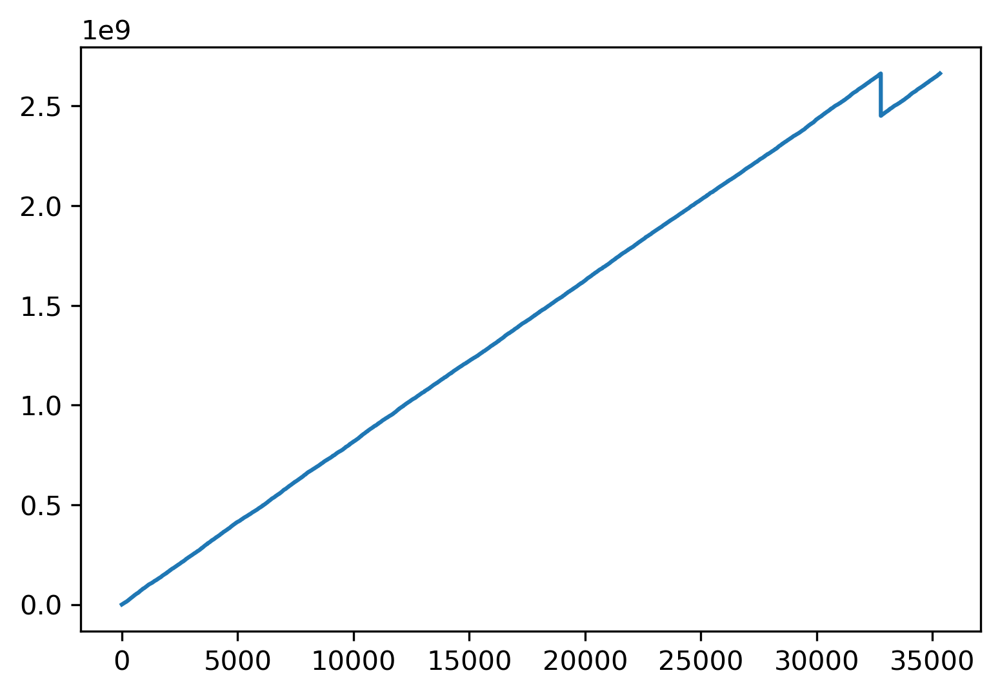

In [70]:
plt.plot(test['event_data']['timestamp'])
#plt.xlim(0,1500)

In [46]:
1800*6

10800

Checking for Saturation:   0%|          | 0/193591 [00:00<?, ?it/s]

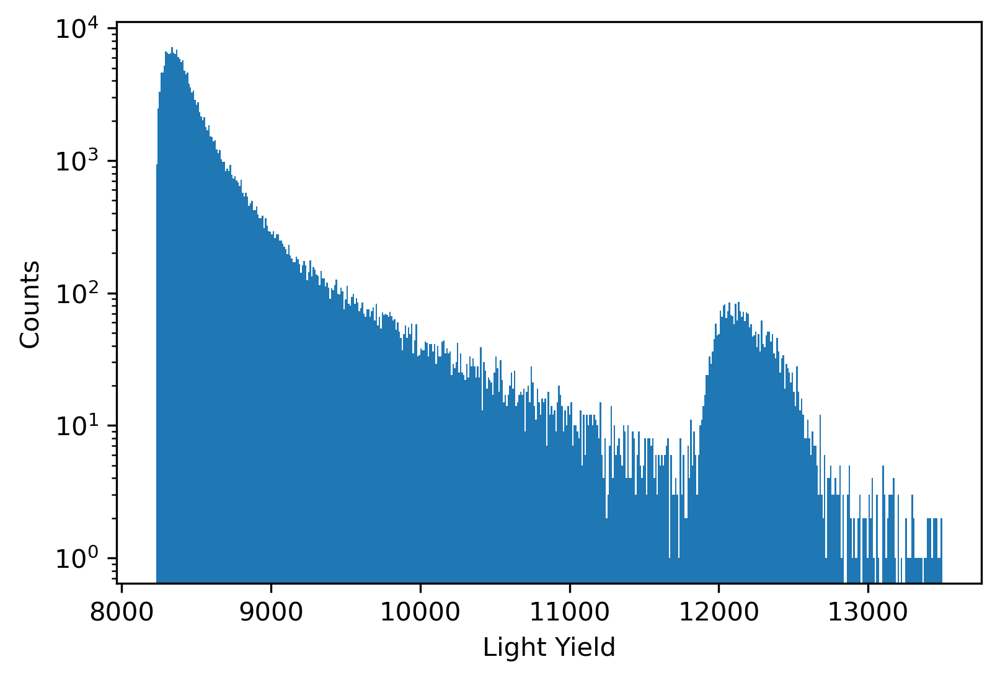

In [12]:
data, sat = import_data('Data/CLLBC/Combined_Data/CLLBC-Cf252-25cm-6.h5')

temp_enes = []

for i in range(len(data)):
    if np.max(data[i]) <= 13500:
        temp_enes.append(np.max(data[i]))
temp_enes = np.array(temp_enes)

plt.hist(temp_enes, bins=2**9)
plt.xlabel('Light Yield')
plt.ylabel('Counts')
plt.semilogy()
plt.savefig('Plots/Cf252-Spectra.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

Checking for Saturation:   0%|          | 0/107323 [00:00<?, ?it/s]

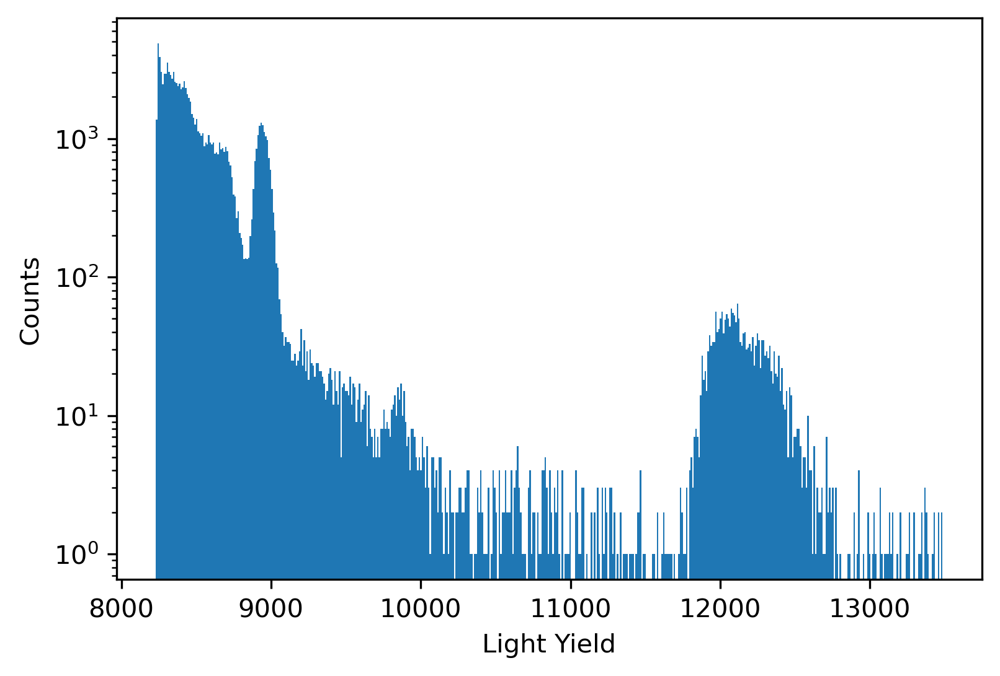

In [11]:
data, sat = import_data('Data/CLLBC/Combined_Data/CLLBC-Cs137-25cm-final-10.h5')

temp_enes = []

for i in range(len(data)):
    if np.max(data[i]) <= 13500:
        temp_enes.append(np.max(data[i]))
temp_enes = np.array(temp_enes)

plt.hist(temp_enes, bins=2**9)
plt.xlabel('Light Yield')
plt.ylabel('Counts')
plt.semilogy()
plt.savefig('Plots/Cs137-n_near-Spectra.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

Checking for Saturation:   0%|          | 0/102655 [00:00<?, ?it/s]

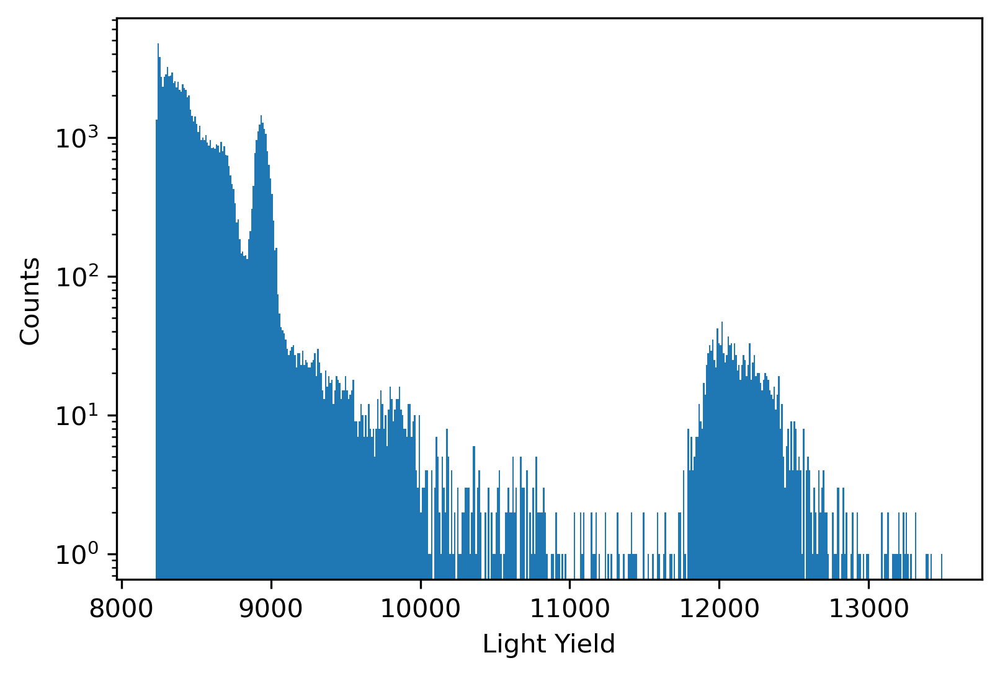

In [13]:
data, sat = import_data('Data/CLLBC/Combined_Data/CLLBC-Cs137-25cm-no-n-10.h5')

temp_enes = []

for i in range(len(data)):
    if np.max(data[i]) <= 13500:
        temp_enes.append(np.max(data[i]))
temp_enes = np.array(temp_enes)

plt.hist(temp_enes, bins=2**9)
plt.xlabel('Light Yield')
plt.ylabel('Counts')
plt.semilogy()
plt.savefig('Plots/Cs137-n_far-Spectra.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

(8600.0, 9500.0)

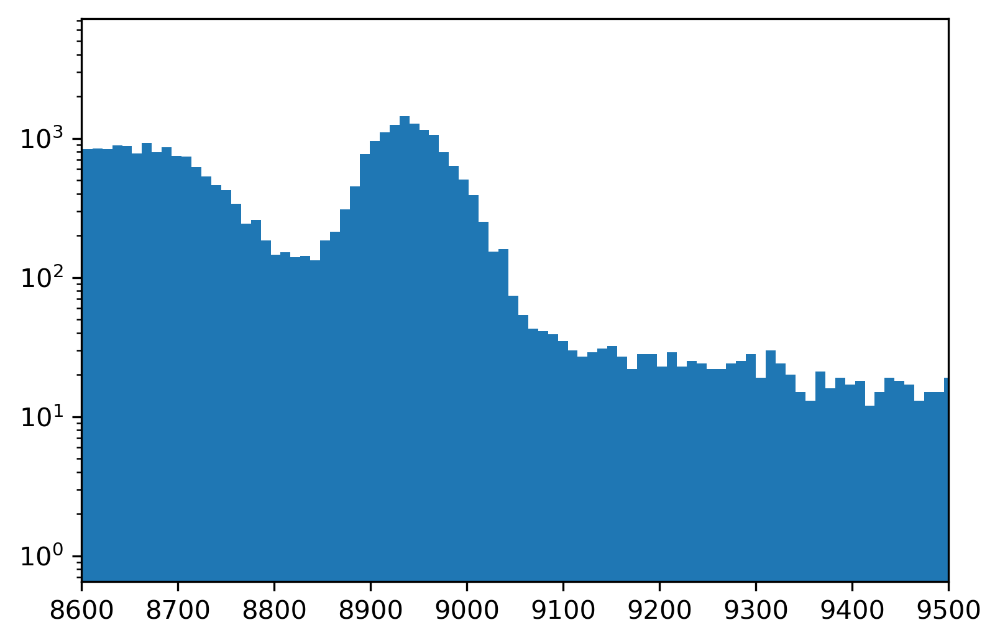

In [15]:
plt.hist(temp_enes, bins=2**9)
plt.semilogy()
plt.xlim(8600, 9500)

In [19]:
trapezoid_filter

<function NE204_Functions.trapezoid_filter(pulse, peaking_time=500, gap_time=2500, tau=15000, samp_size=500)>

In [27]:
savgol_filter

<function scipy.signal._savitzky_golay.savgol_filter(x, window_length, polyorder, deriv=0, delta=1.0, axis=-1, mode='interp', cval=0.0)>

In [9]:
def exp_test(x, A, tau):
    return A*np.exp(-x/tau)

In [28]:
decays = []

for i in tqdm(range(1000)):

    data_temp = reset_zero(data[i], samp_size=50)
    temp_start = np.argmax(data_temp)

    data_temp2 = data_temp[temp_start:]
    res, cov = curve_fit(exp_test, np.arange(len(data_temp2)), data_temp2)

    decays.append(res[1])
decays = np.array(decays)

  0%|          | 0/1000 [00:00<?, ?it/s]

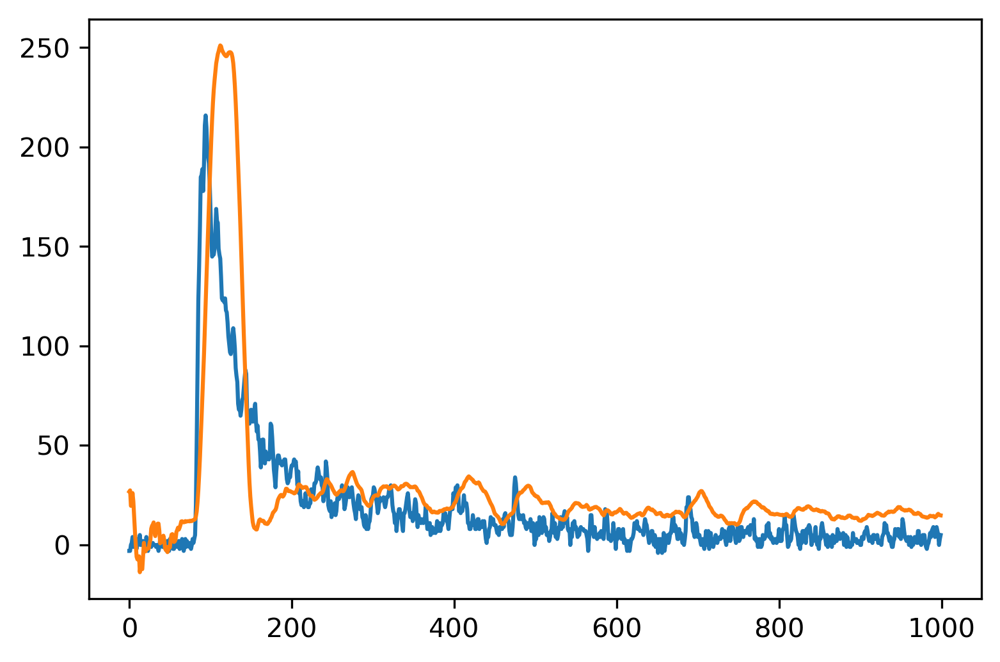

In [57]:
i = 0
plt.plot(reset_zero(savgol_filter(data[i], 1, 0), samp_size=50))
plt.plot(trapezoid_filter(savgol_filter(data[i], 1, 0), 20, 25, 50, samp_size=50))

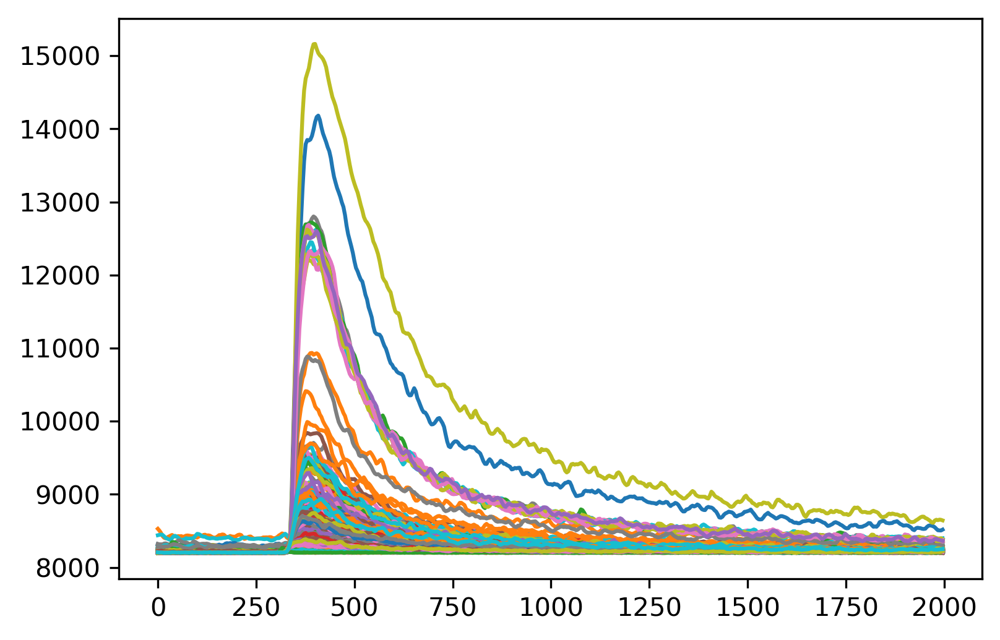

In [29]:
for i in range(1000):
    plt.plot(np.arange(len(data_test[0]))*4, data_test[i])
#plt.xlim(300, 400)
plt.show()

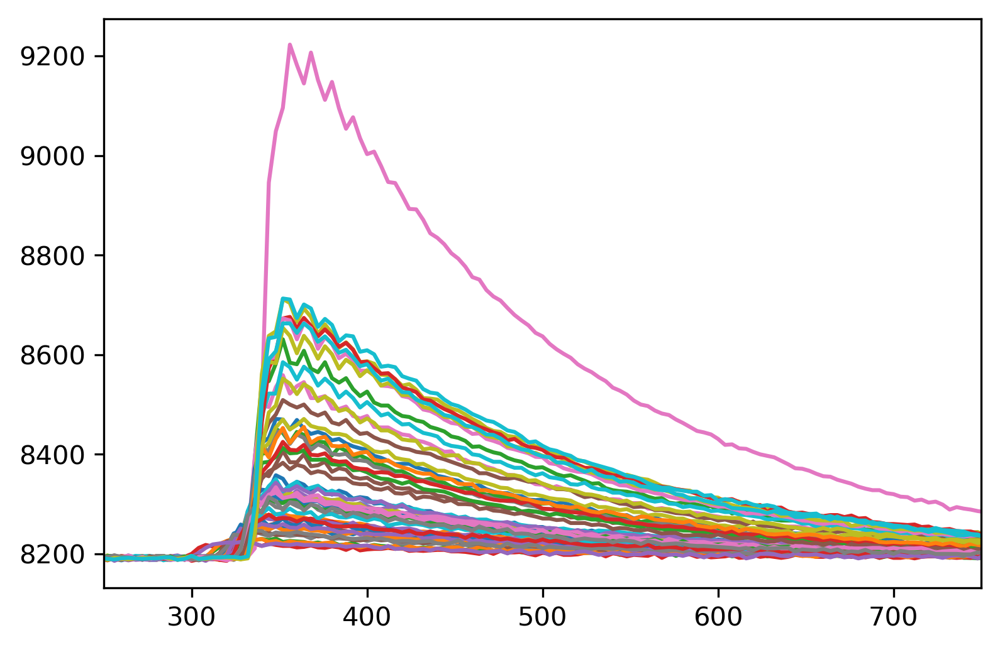

In [6]:
for i in range(50):
    plt.plot(np.arange(len(data_cs[0]))*4, data_cs[i])
plt.xlim(250, 750)
plt.show()

74


(0.0, 0.7)

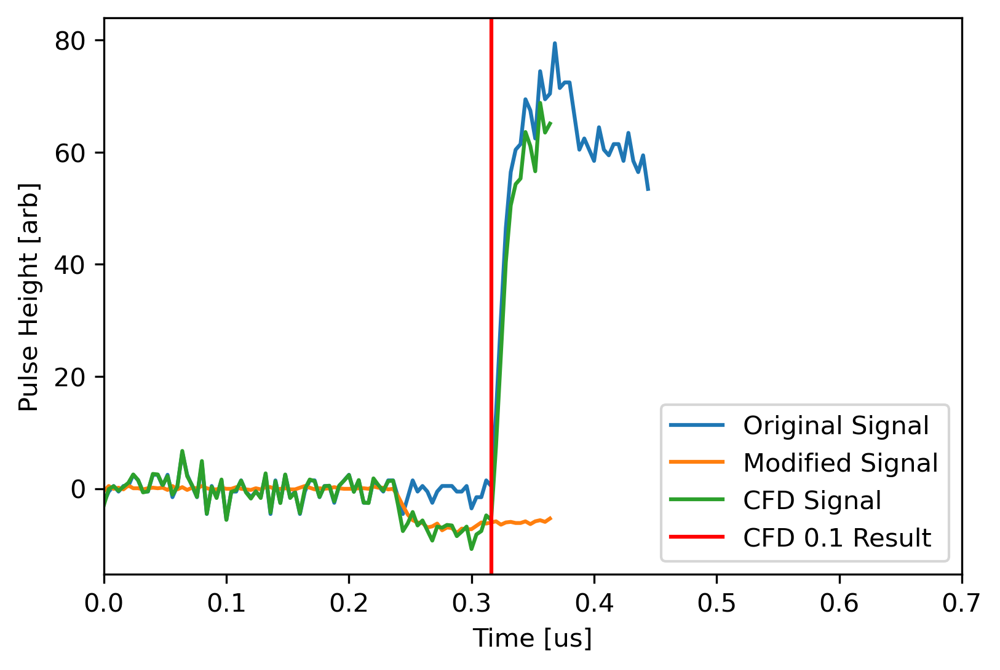

In [13]:
CFD(data_cf[120], 0.1, samp_size=50, shift=20, pf=True)
print(CFD(data_cf[100], 0.1, samp_size=20, shift=50))
plt.xlim(0,0.7)

In [52]:
def quick_psd(data, threshold, min_, max_):
    data_r = reset_zero(data[:max_], samp_size=5)
    
    total = np.sum(data_r[min_:])
    
    tail = np.sum(data_r[min_+threshold:])
    
    return tail, total

In [15]:
max_ = 300
totals, tails = [], []
rises = []
inds = []
pileup = np.argwhere(np.argmax(data_cf, axis=1)>100)[:,0]
for i in tqdm(range(len(data_cf))):
    if i not in pileup:
        inds.append(i)
        min_ = CFD(data_cf[i][:120], 0.1, samp_size=50, shift=20)
        rises.append(min_)
        temp = quick_psd(data_cf[i], 16, min_-3, max_)
        tails.append(temp[0])
        totals.append(temp[1])
totals = np.array(totals)
tails = np.array(tails)
rises = np.array(rises)
inds = np.array(inds)

  0%|          | 0/52302 [00:00<?, ?it/s]

In [105]:
min_ = CFD(data_cf[0][:120], 0.1, samp_size=50, shift=20)
test = quick_psd(data_cf[0], 16, min_-3, 300)

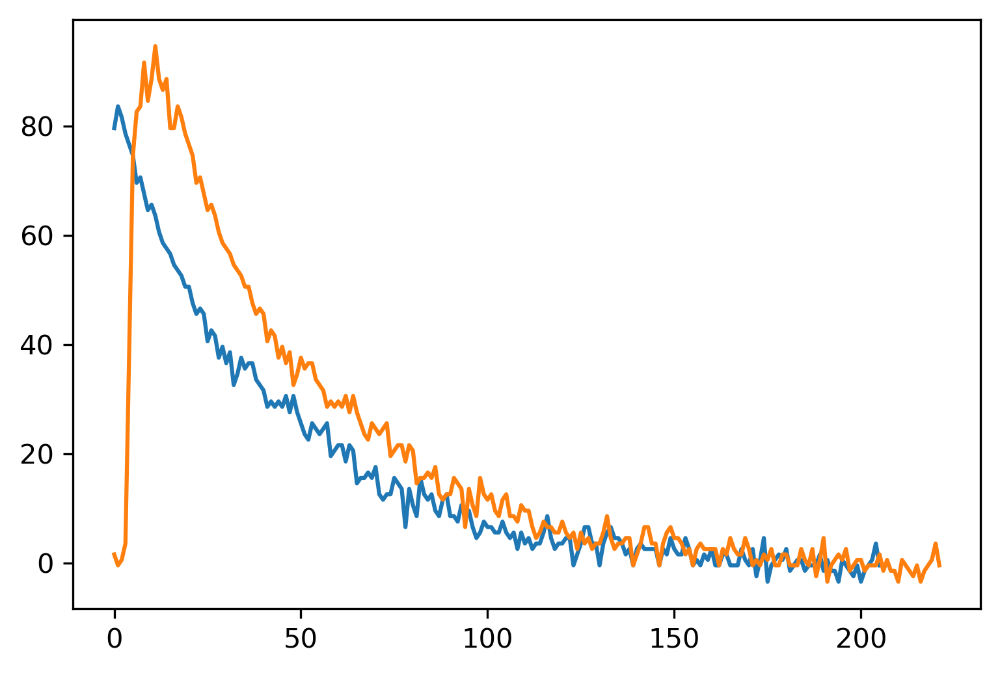

In [106]:
plt.plot(test[0])
plt.plot(test[1])

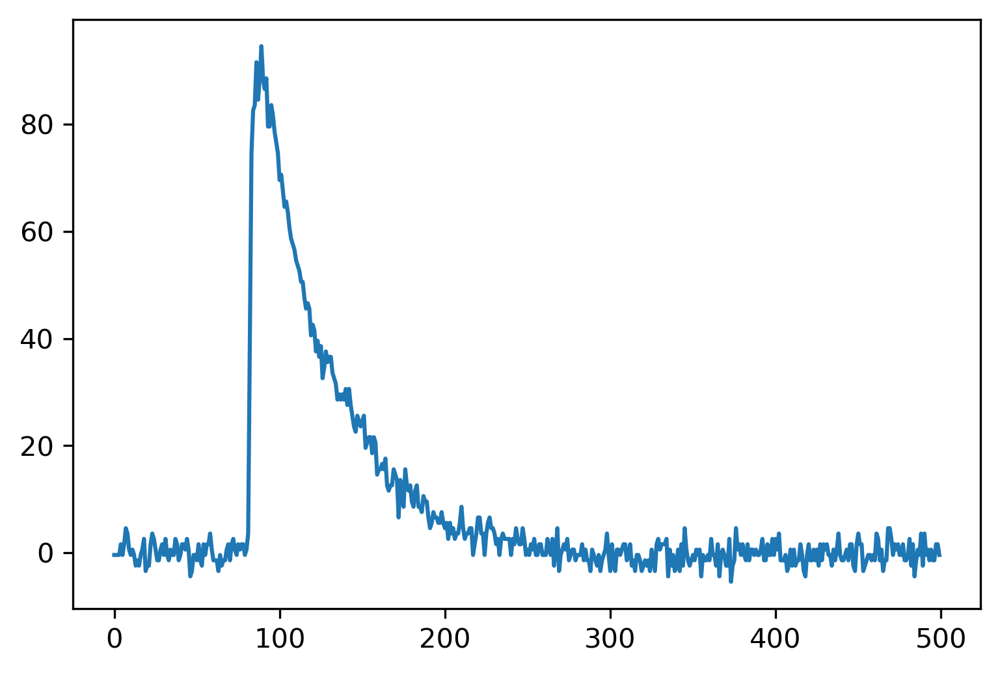

In [103]:
plt.plot(reset_zero(data_cf[0], samp_size=5))

In [89]:
totals

array([ 113.2, 8123.2,   67. , ...,  307.8,  335. ,  163. ])

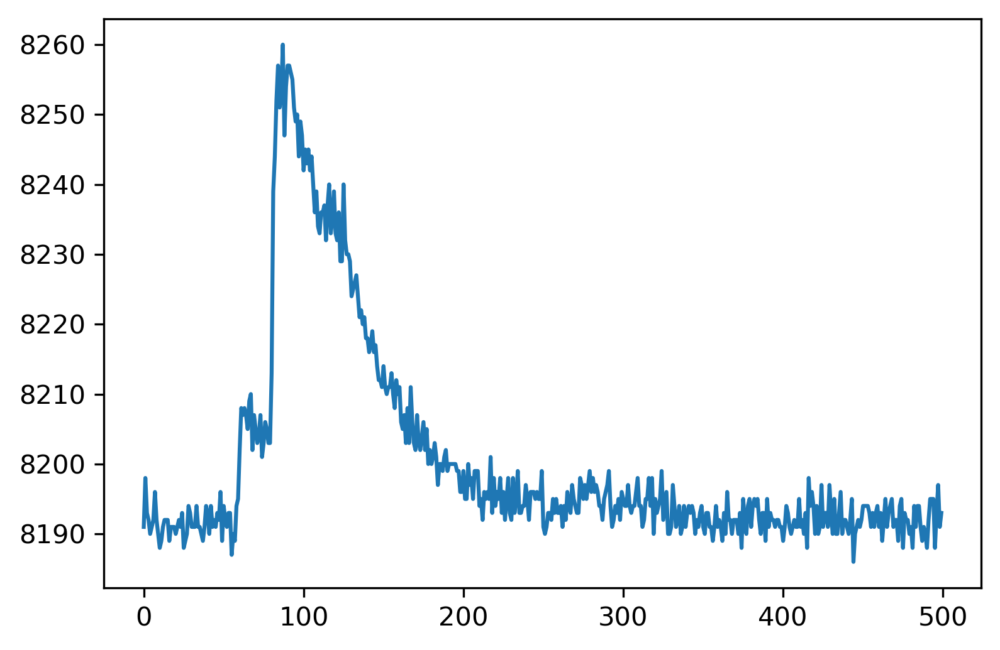

In [60]:
plt.plot(data_cf[np.argmin(rises)])

In [66]:
bad_maybe[0][:,0]

array([  361,  1111,  1425,  1801,  2839,  3770,  4327,  5929,  6203,
        6374,  6529,  6827,  7378,  7548,  8282,  9156,  9323,  9540,
        9820,  9847, 10118, 10616, 10632, 10876, 11886, 12201, 14473,
       14513, 14762, 15060, 15722, 15737, 15939, 16442, 16805, 17288,
       17315, 18407, 18597, 18740, 19444, 21167, 21991, 22649, 22951,
       23152, 23922, 24845, 25058, 26000, 26819, 26949, 27159, 27404,
       28455, 29024, 29304, 29601, 29727, 30297, 31178, 31567, 31887,
       32207, 32758, 34541, 35091, 35131, 36197, 36657, 36697, 37175,
       37902, 38277, 38335, 38510, 38681, 40373, 40441, 40587, 40611,
       41057, 41805, 44057, 44716, 44806, 44831, 46146, 46270, 47168,
       47822, 48587, 48590, 49440, 49564, 50462, 51116, 51881, 51884])

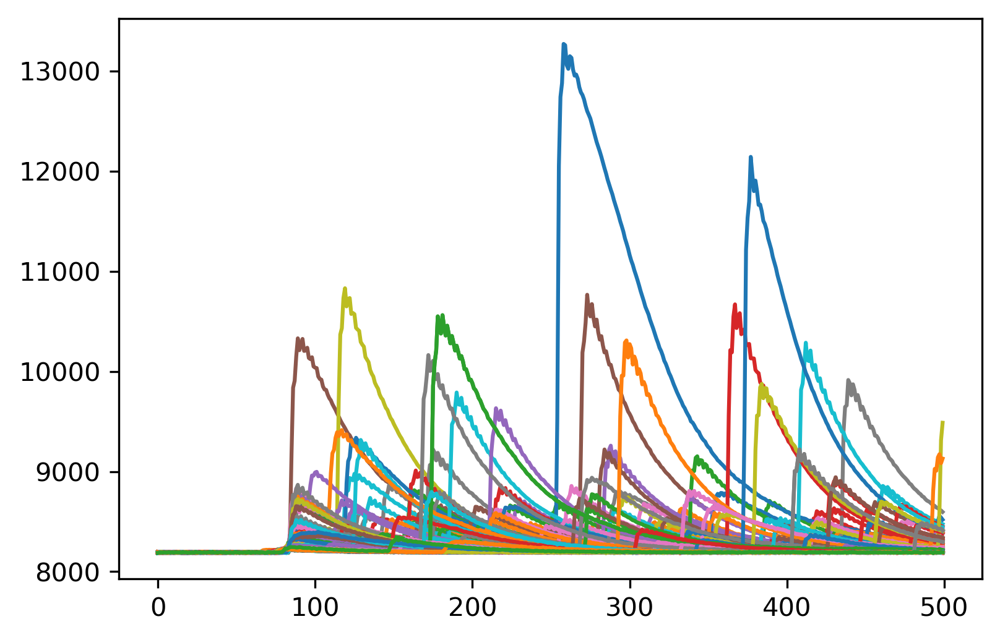

In [81]:
test = np.argwhere(np.argmax(data_cf, axis=1)>100)[:,0]

for t in test:
    plt.plot(data_cf[t])

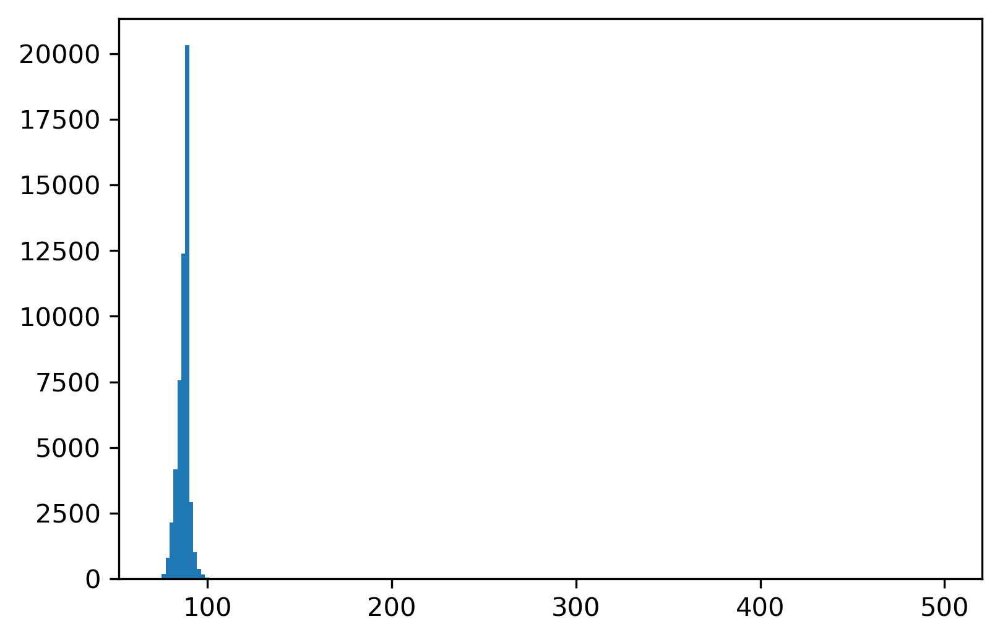

In [79]:
plt.hist(np.argmax(data_cf, axis=1), bins=200)
plt.show()

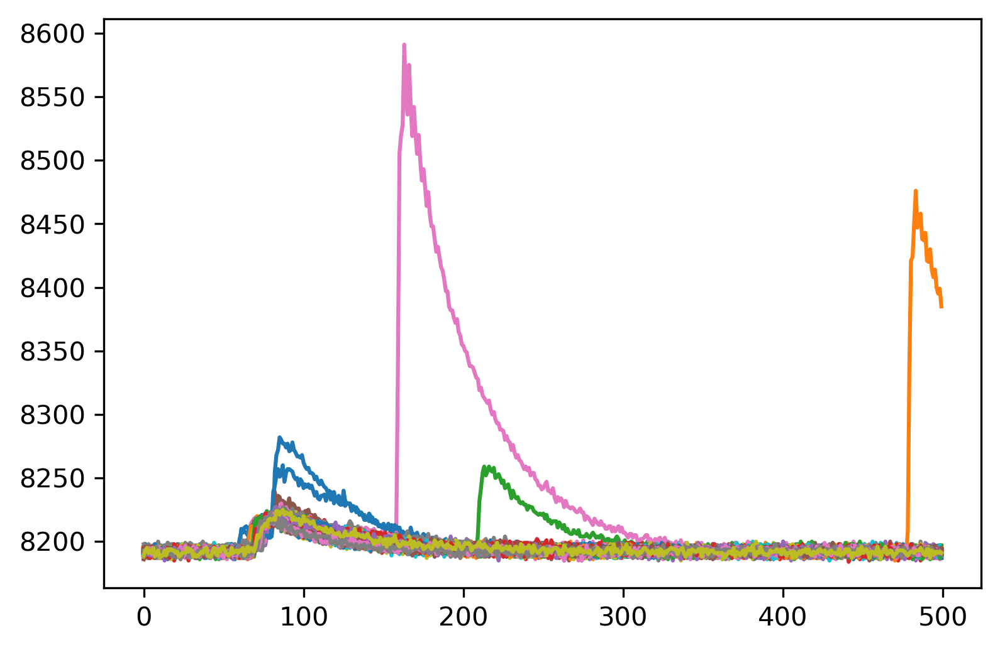

In [72]:
bad_maybe = np.argwhere(rises<70)[:,0]

for bm in bad_maybe:
    plt.plot(data_cf[bm])

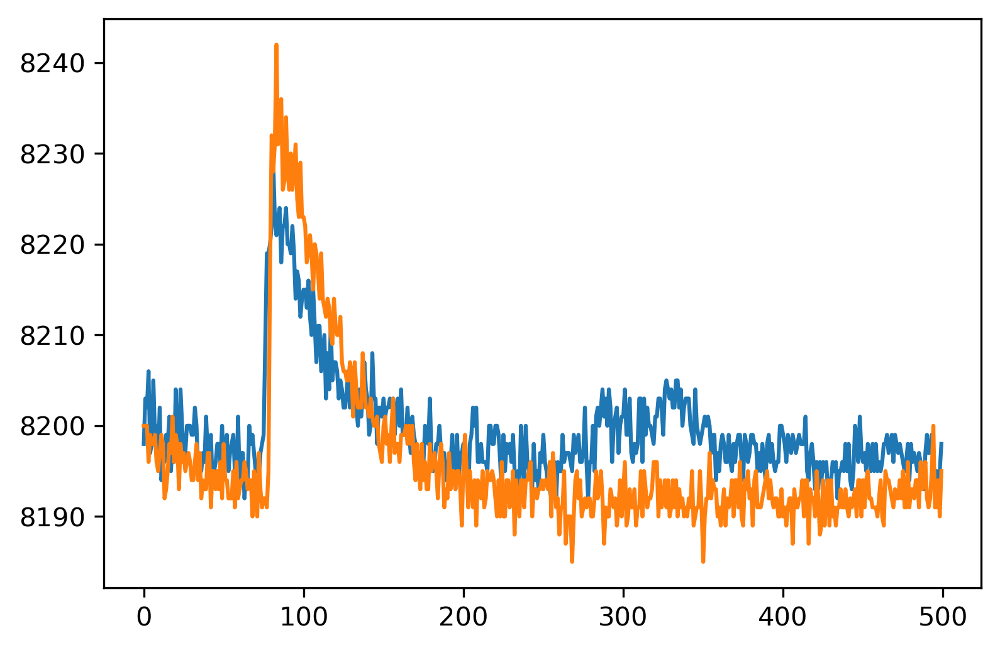

In [119]:
neg = inds[np.argwhere(tails<0)[:,0]]

for n in neg:
    plt.plot(data_cf[n])

In [125]:
np.arange(1, 20)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])

In [21]:
max_ = 300
pileup = np.argwhere(np.argmax(data_cf, axis=1)>100)[:,0]
t_tot, t_tail = [], []
thresh = np.arange(9, 76)
for thr in tqdm(thresh):
    totals, tails = [], []
    rises = []
    inds = []
    for i in tqdm(range(len(data_cf)), leave=False):
        if i not in pileup:
            inds.append(i)
            min_ = CFD(data_cf[i][:120], 0.1, samp_size=50, shift=20)
            rises.append(min_)
            temp = quick_psd(data_cf[i], thr, min_-3, max_)
            tails.append(temp[0])
            totals.append(temp[1])
    totals = np.array(totals)
    tails = np.array(tails)
    rises = np.array(rises)
    inds = np.array(inds)
    
    t_tot.append(totals)
    t_tail.append(tails)
    
t_tot = np.array(t_tot)
t_tail = np.array(t_tail)

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

  0%|          | 0/52302 [00:00<?, ?it/s]

In [17]:
for i in tqdm(range(len(t_tot))): #len(t_tot)):
    plt.hist(t_tail[i]/t_tot[i], bins=np.linspace(0.1, 1, 500), 
             label='Threshold {}'.format(thresh[i]))
    #plt.legend(fontsize=5, ncol=2)
    plt.legend()
    plt.xlabel('Tail/Total Ratio')
    plt.ylabel('Counts')
    plt.savefig('Plots/TtT-Hists-NoInterp/TtT-{}Thresh.png'.format(thresh[i]), 
                dpi=300, facecolor='white', bbox_inches='tight')
    plt.close()

  0%|          | 0/75 [00:00<?, ?it/s]

In [32]:
np.argwhere(thresh==22)[:,0][0]

13

(0.0, 120000.0)

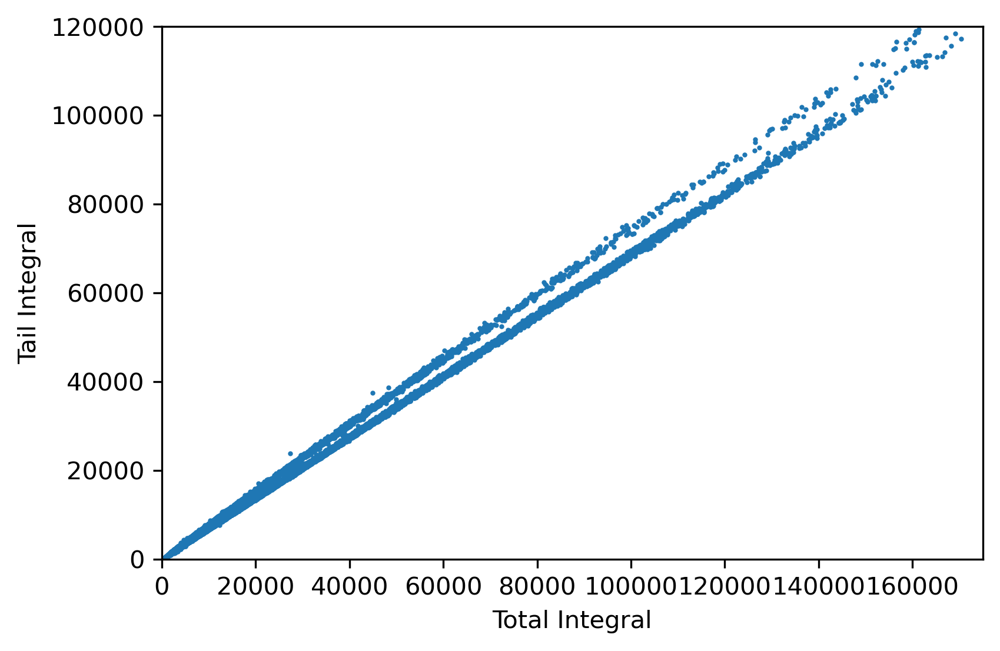

In [168]:
plt.scatter(t_tot[np.argwhere(thresh==21)[:,0][0]], t_tail[np.argwhere(thresh==21)[:,0][0]], s=1)
plt.xlabel('Total Integral')
plt.ylabel('Tail Integral')
plt.xlim(0, 1.75e5)
plt.ylim(0, 1.2e5)

In [106]:
def gauss(x, H, A, x0, sigma):
    # Gaussian signal shape
    return H + A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))

def double_gauss(x, A1, mu1, sig1, A2, mu2, sig2):
    # Assuming no background
    return gauss(x, 0, A1, mu1, sig1) + gauss(x, 0, A2, mu2, sig2)

In [162]:
curve_fit

<function scipy.optimize.minpack.curve_fit(f, xdata, ydata, p0=None, sigma=None, absolute_sigma=False, check_finite=True, bounds=(-inf, inf), method=None, jac=None, **kwargs)>

In [177]:
binsss[np.argmax(counts)]

0.7431438127090301

In [191]:
binsss[np.argmax(counts)]

0.7407035175879397

In [197]:
test_fit[0][2]

-0.04648674905444311

In [193]:
test_fit[0][3]

3787.0790698899095

array([22])

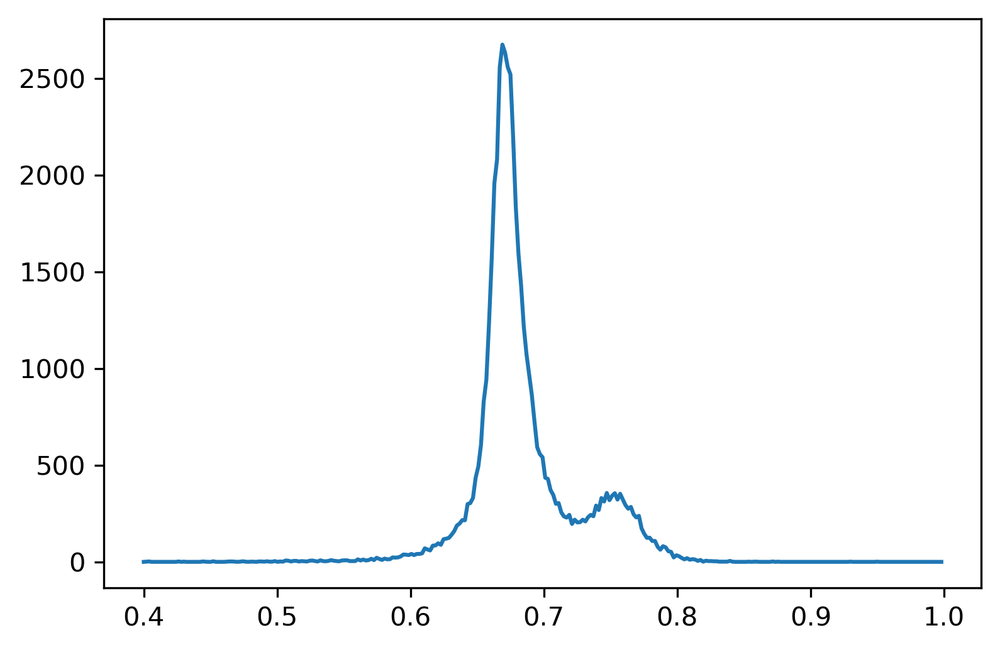

In [34]:
counts, binsss, p = plt.hist(t_tail[np.argwhere(thresh==22)[:,0][0]]/t_tot[np.argwhere(thresh==22)[:,0][0]], 
                             bins=np.linspace(0.4, 1, 300))
plt.close()
#test_fit = curve_fit(double_gauss, binsss[:-1], counts)#, 
                     #p0=[max(counts), binsss[np.argmax(counts)], ])

plt.plot(binsss[:-1], counts)
#plt.plot(binsss[:-1], double_gauss(binsss[:-1], *test_fit[0]))
# plt.plot(binsss[:-1], double_gauss(binsss[:-1], 
#                                    max(counts), binsss[np.argmax(counts)], 0.008,
#                                   800, 0.84, 0.015))

In [49]:
from scipy.signal import find_peaks

In [113]:
def gauss_new(x, A, x0, sigma):
    # Gaussian signal shape
    return A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))

In [151]:
thresh[2:]

array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75])

In [163]:
foms = []
for tt, thresh_test in enumerate(tqdm(thresh[2:])):
    counts, binsss, p = plt.hist(t_tail[np.argwhere(thresh==thresh_test)[:,0][0]]/t_tot[np.argwhere(thresh==thresh_test)[:,0][0]], 
                             bins=np.linspace(0, 1, 500))
    plt.close()
    
    dh = savgol_filter(counts, 3, 0)
    peaks, proms = find_peaks(dh, prominence=2)
    first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
    second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

    dip = np.argmin(dh[first:second])+first

    fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], dh[:dip])
    fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], dh[dip:])

    fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))
    
    foms.append(fom)
foms = np.array(foms)

  0%|          | 0/65 [00:00<?, ?it/s]

In [166]:
thresh[2:][np.argmax(foms)]

21

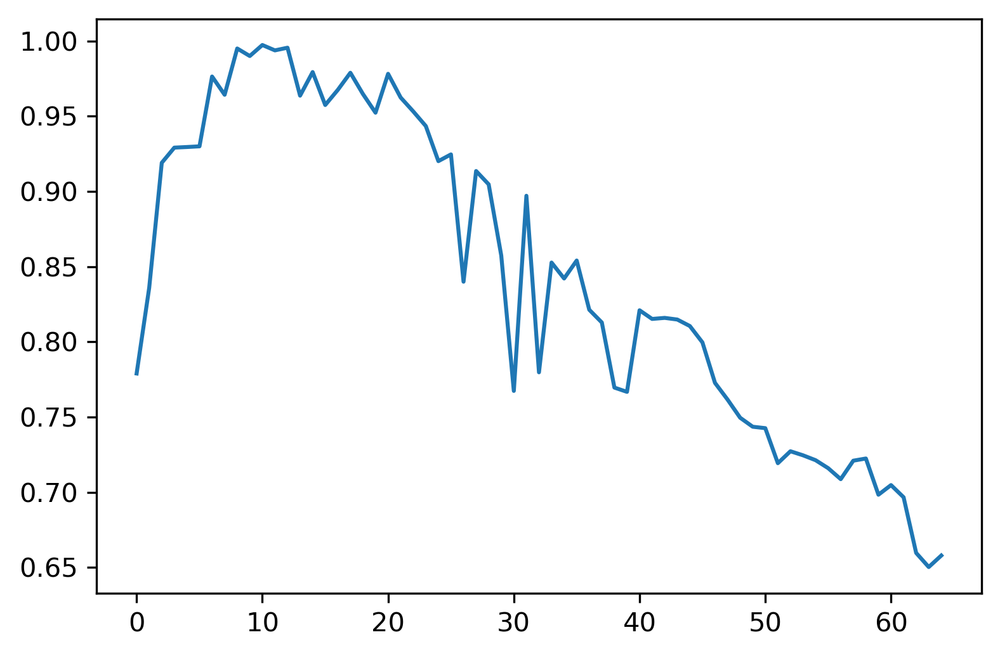

In [164]:
plt.plot(foms)

Calculated FOM: 0.8124019066203023


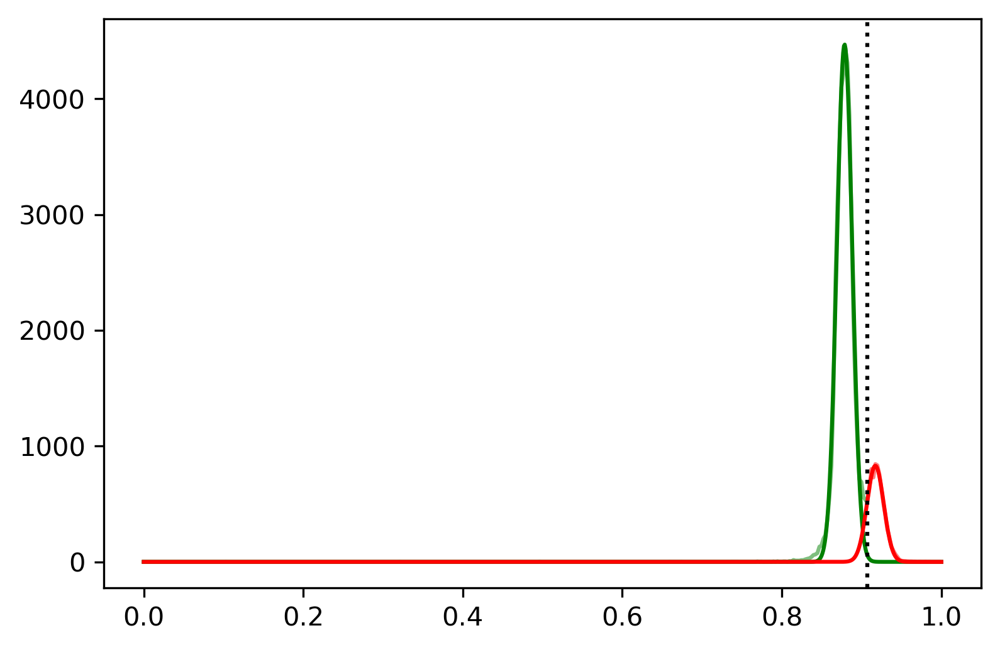

In [150]:
thresh_test = 11

counts, binsss, p = plt.hist(t_tail[np.argwhere(thresh==thresh_test)[:,0][0]]/t_tot[np.argwhere(thresh==thresh_test)[:,0][0]], 
                             bins=np.linspace(0, 1, 400))
plt.close()

#dh = savgol_filter(counts, 3, 0)
dh = counts

peaks, proms = find_peaks(dh, prominence=2)
first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

dip = np.argmin(dh[first:second])+first

fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))

print('Calculated FOM: {}'.format(fom))

x = np.linspace(0,1,1000)
plt.plot(x, gauss_new(x, *fit_gamma), color='green')
plt.plot(binsss[:dip], counts[:dip], color='green', alpha=0.5)

plt.plot(x, gauss_new(x, *fit_neutron), color='red')
plt.plot(binsss[dip:-1], counts[dip:], color='red', alpha=0.5)
#plt.axvline(first, color='red')
#plt.axvline(second, color='red')
plt.axvline(binsss[dip], color='black', linestyle=':')

plt.show()

In [138]:
fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(fit_gamma[2]+fit_neutron[2]))

NameError: name 'fomnp' is not defined

In [133]:
fit_gamma[2]

0.015811832593718766

In [135]:
fit_gamma[1]

0.33650611926094914

In [134]:
2*np.sqrt(np.log(2)*2)*fit_gamma[2]

0.03723402034036266

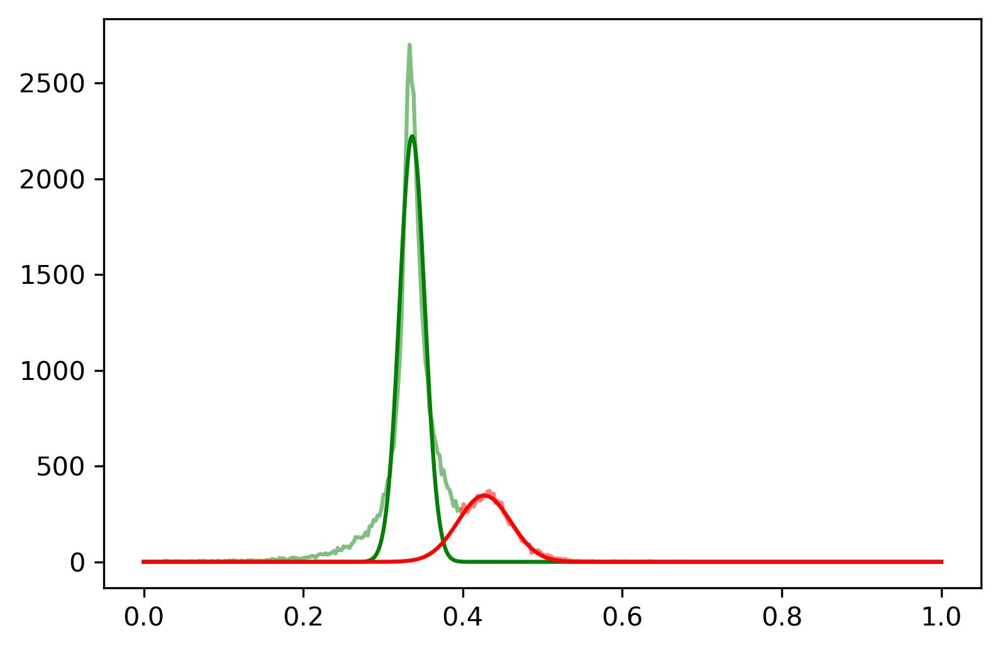

In [125]:
fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

x = np.linspace(0,1,1000)
plt.plot(x, gauss_new(x, *fit_gamma), color='green')
plt.plot(binsss[:dip], counts[:dip], color='green', alpha=0.5)

plt.plot(x, gauss_new(x, *fit_neutron), color='red')
plt.plot(binsss[dip:-1], counts[dip:], color='red', alpha=0.5)

plt.show()

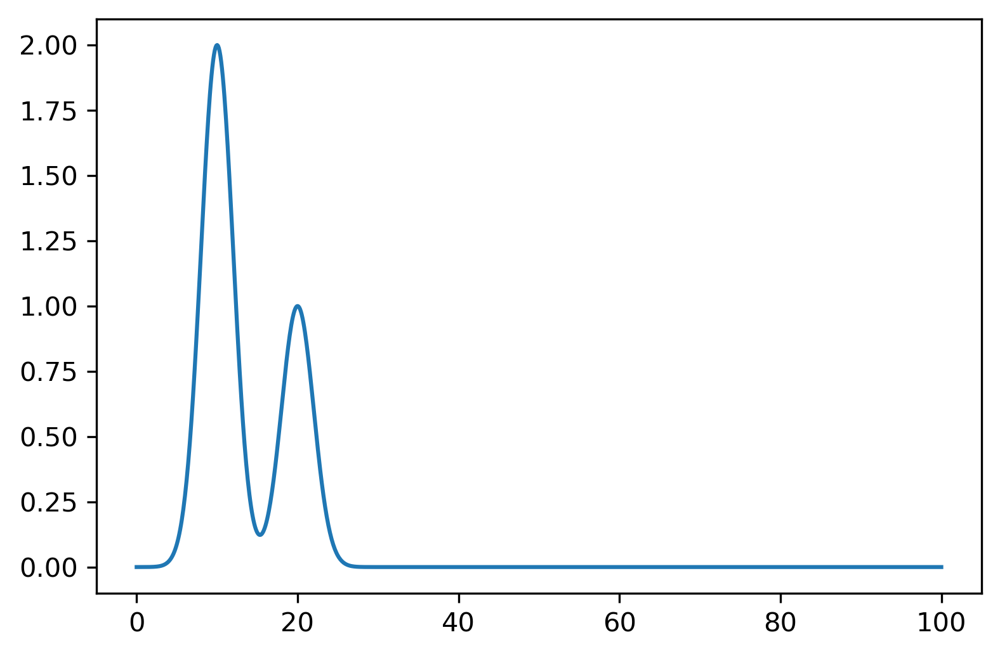

In [159]:
plt.plot(x, double_gauss(x, 2, 10, 2, 1, 20, 2))

In [187]:
s

<function NE204_Functions.s(signal, start_rise, tau, peaking_time, gap_time, w=0)>

In [ ]:
s(data_cf[])

In [48]:
test_energies_cf = calibrate_pulses(data_cf, peak=10, gap=20, tau=65, calibrated=False, svw=3, use_CFD=True, shift=20, samp_size=50)

Creating spectra:   0%|          | 0/52302 [00:00<?, ?it/s]

Index 2597 failed to fit or create trapezoid
Index 4328 failed to fit or create trapezoid
Index 5631 failed to fit or create trapezoid
Index 6585 failed to fit or create trapezoid
Index 8343 failed to fit or create trapezoid
Index 9591 failed to fit or create trapezoid
Index 9675 failed to fit or create trapezoid
Index 13404 failed to fit or create trapezoid
Index 16509 failed to fit or create trapezoid
Index 21454 failed to fit or create trapezoid
Index 21827 failed to fit or create trapezoid
Index 22987 failed to fit or create trapezoid
Index 34537 failed to fit or create trapezoid
Index 36594 failed to fit or create trapezoid
Index 41057 failed to fit or create trapezoid
Index 44282 failed to fit or create trapezoid
Index 45600 failed to fit or create trapezoid
Index 45769 failed to fit or create trapezoid
Index 46443 failed to fit or create trapezoid
Index 47912 failed to fit or create trapezoid
Index 49063 failed to fit or create trapezoid
Index 49737 failed to fit or create trape

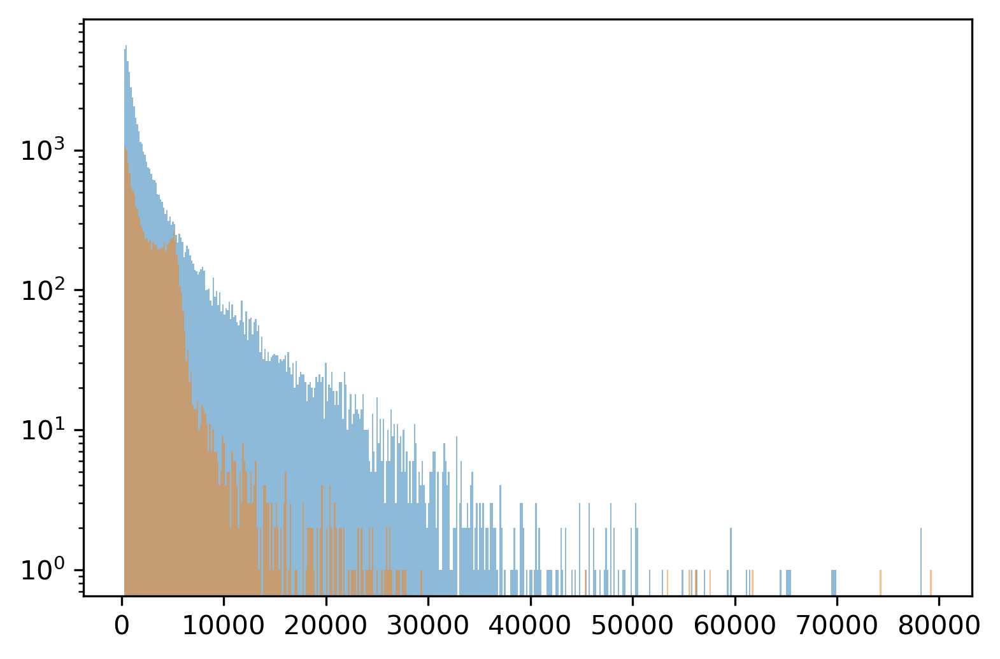

In [49]:
plt.hist(test_energies_cf[test_energies_cf < 80000], bins=2**9, alpha=0.5)
plt.hist(test_energies_new[test_energies_new < 80000], bins=2**9, alpha=0.5)
plt.semilogy()
plt.show()

In [215]:
data, sat = import_data('Data/Combined_Data/EJ-301-Test-Cs137-3_close.h5')

In [216]:
max_ = 300
pileup = np.argwhere(np.argmax(data, axis=1)>100)[:,0]
totals, tails = [], []
enes, ths = [], []
for i in tqdm(range(len(data)), leave=False):
    if i not in pileup and i not in sat:
        sig = savgol_filter(data[i], 3, 0)
        min_ = CFD(data[i][:120], 0.1, samp_size=50, shift=20)
        trap = s(sig, min_-5, tau=65, peaking_time=10, gap_time=20)
        enes.append(max(trap))
        ths.append(max(sig))
        temp = quick_psd(data[i], 21, min_-3, max_)
        tails.append(temp[0])
        totals.append(temp[1])
totals = np.array(totals)
tails = np.array(tails)
enes = np.array(enes)
ths = np.array(ths)

ttt = tails/totals

  0%|          | 0/12561 [00:00<?, ?it/s]

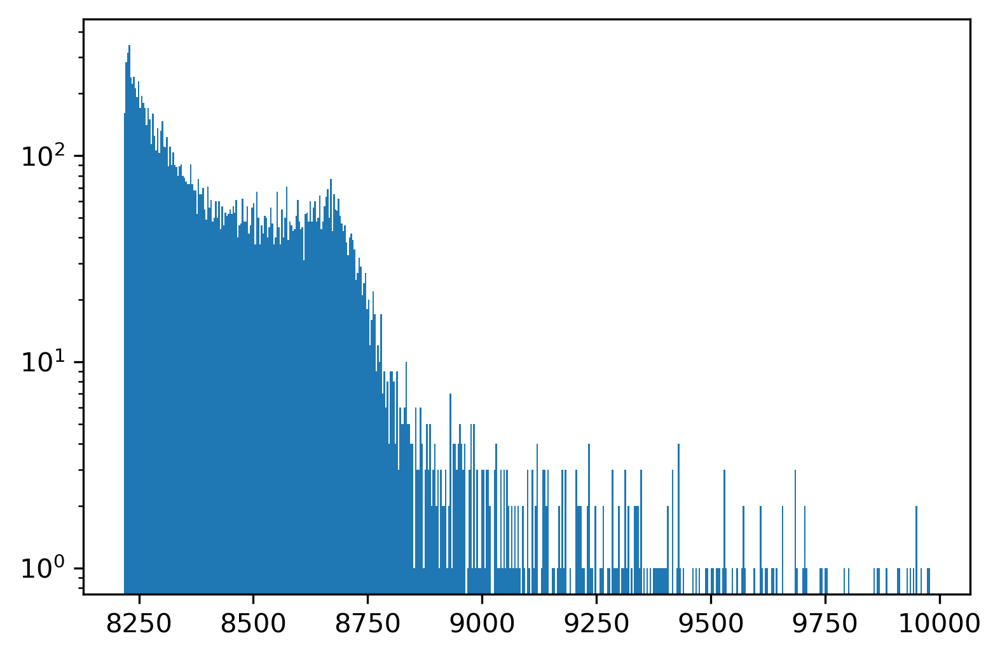

In [223]:
plt.hist(np.where(ths<10000, ths, np.nan), bins=2**9)
plt.semilogy()
plt.show()

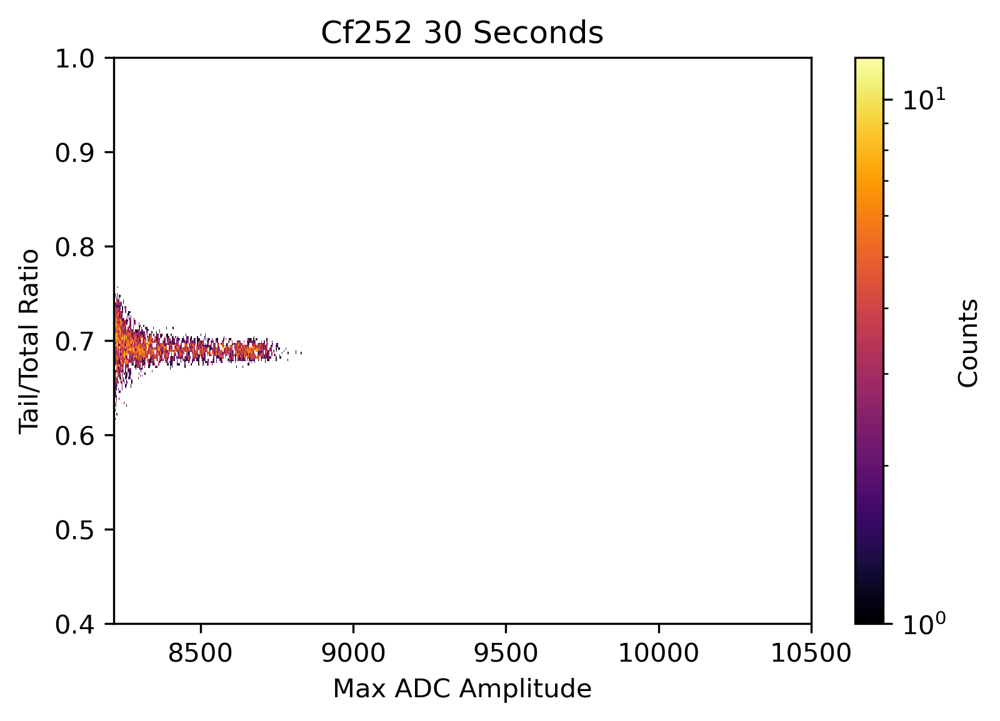

In [217]:
#x_bins = np.linspace(0,3e4,1000)
x_bins = np.linspace(min(ths),10500,1000)
y_bins = np.linspace(0.4,1,250)

psd_image = np.histogram2d(ttt, ths, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min(ths),10500,0.4,1), norm=LogNorm(vmin=1, vmax=np.max(psd_image)))
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Max ADC Amplitude')
plt.title('Cf252 30 Seconds')
cbar = plt.colorbar(label='Counts')
plt.savefig('Plots/PSD-Cs137_maxheight.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

In [191]:
np.linspace(0,3e4,10000)

array([0.00000000e+00, 3.00030003e+00, 6.00060006e+00, ...,
       2.99939994e+04, 2.99969997e+04, 3.00000000e+04])

(0.0, 80000.0)

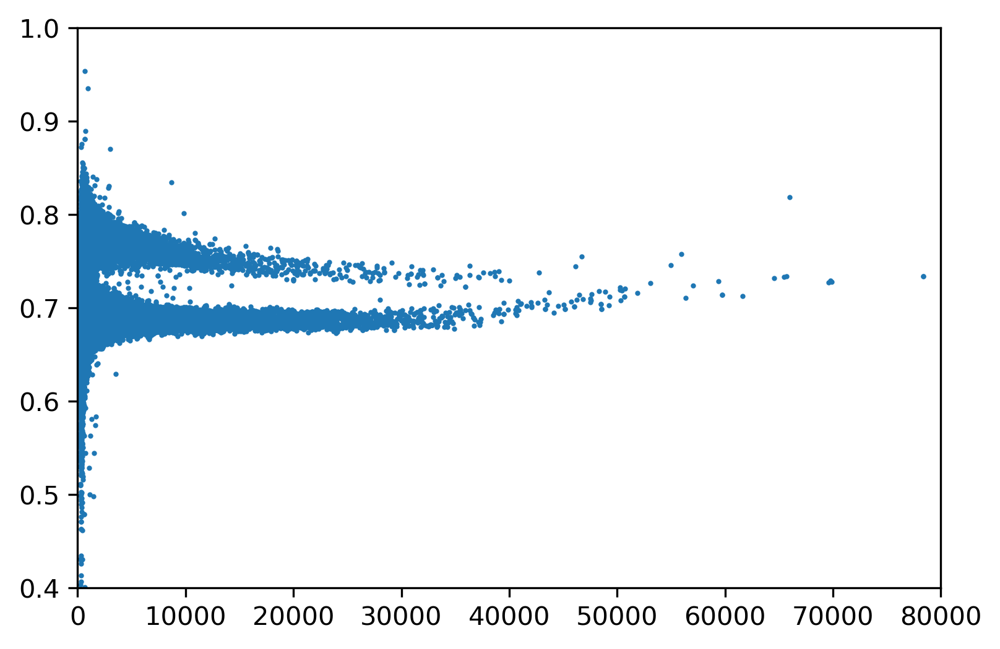

In [67]:
plt.scatter(enes, ttt, s=1)
plt.ylim(0.4,1)
plt.xlim(0,8e4)

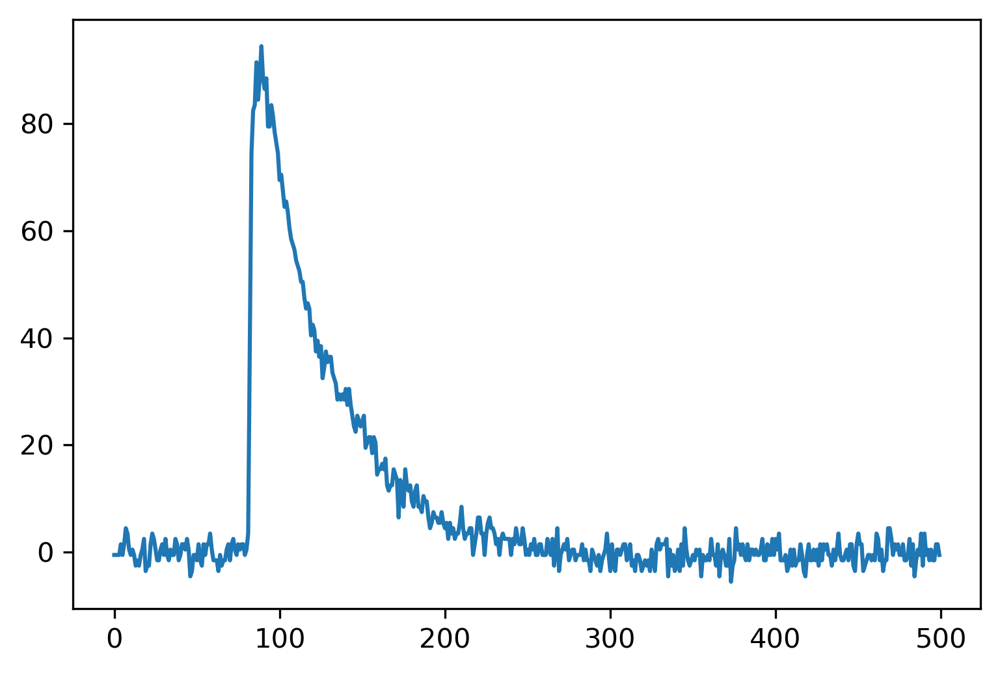

In [171]:
plt.plot(reset_zero(data_cf[0], samp_size=50))

In [ ]:
np.linspace(0, 200000, 100)

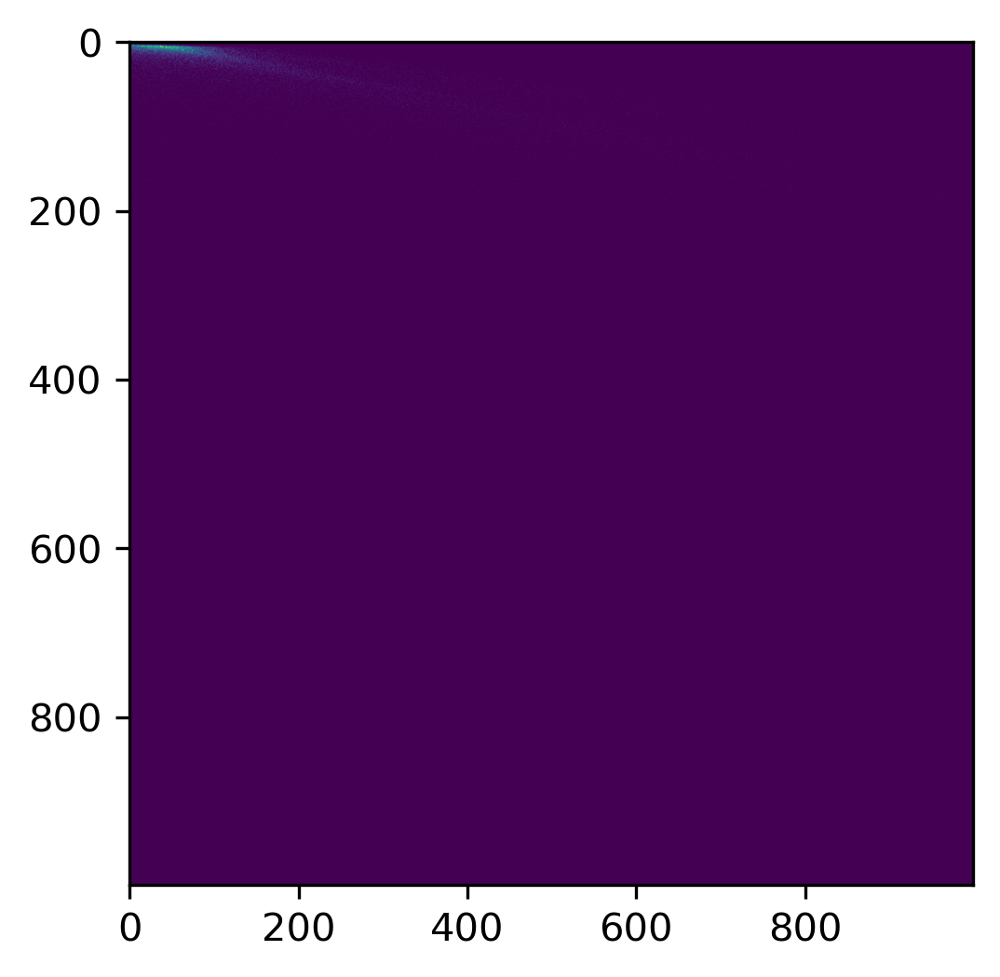

In [49]:
plt.imshow(np.histogram2d(totals, tails, bins=[np.linspace(0, 200000, 1000), np.linspace(0, 2000, 1000)])[0])

In [42]:
np.histogram2d?

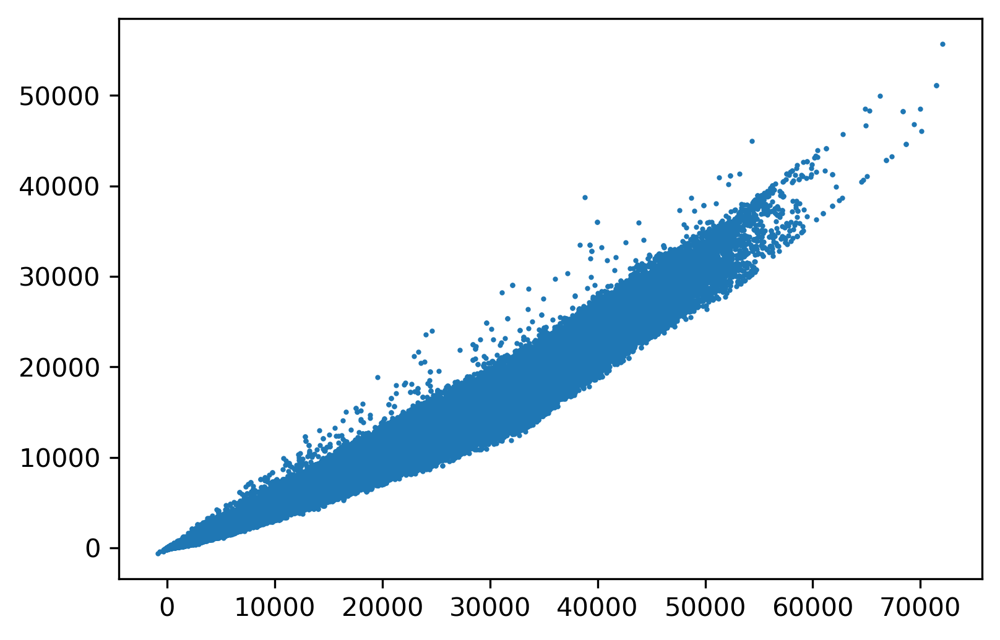

In [63]:
plt.scatter(totals, tails, s=1)

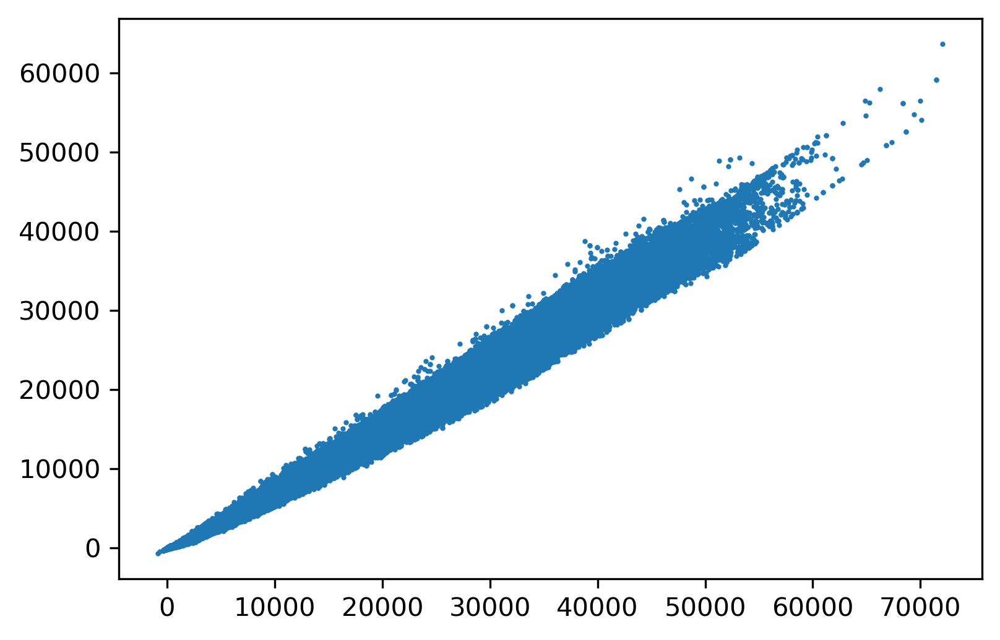

In [65]:
plt.scatter(totals, tails, s=1)

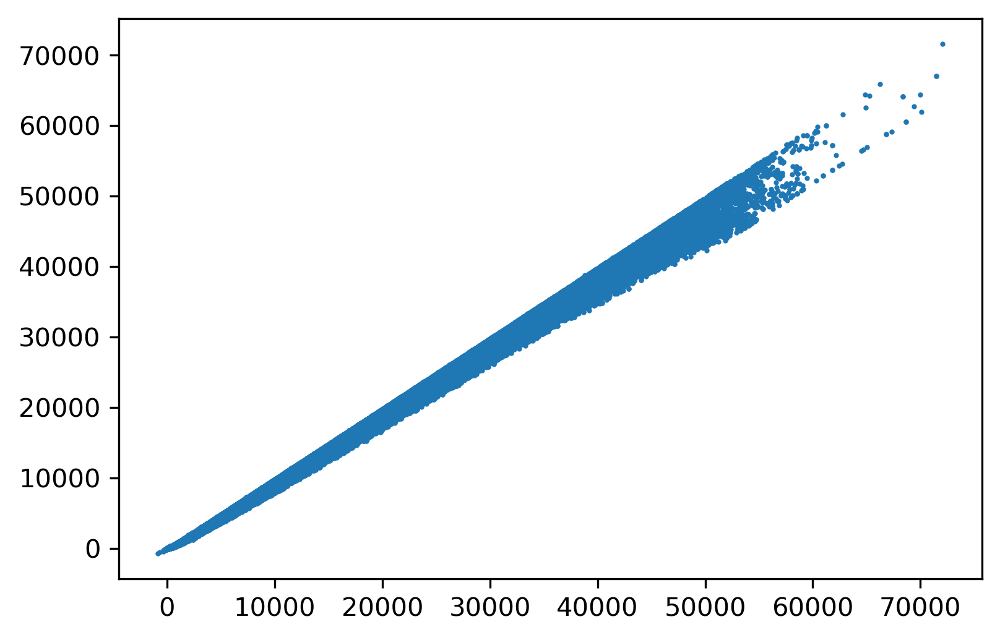

In [67]:
plt.scatter(totals, tails, s=1)

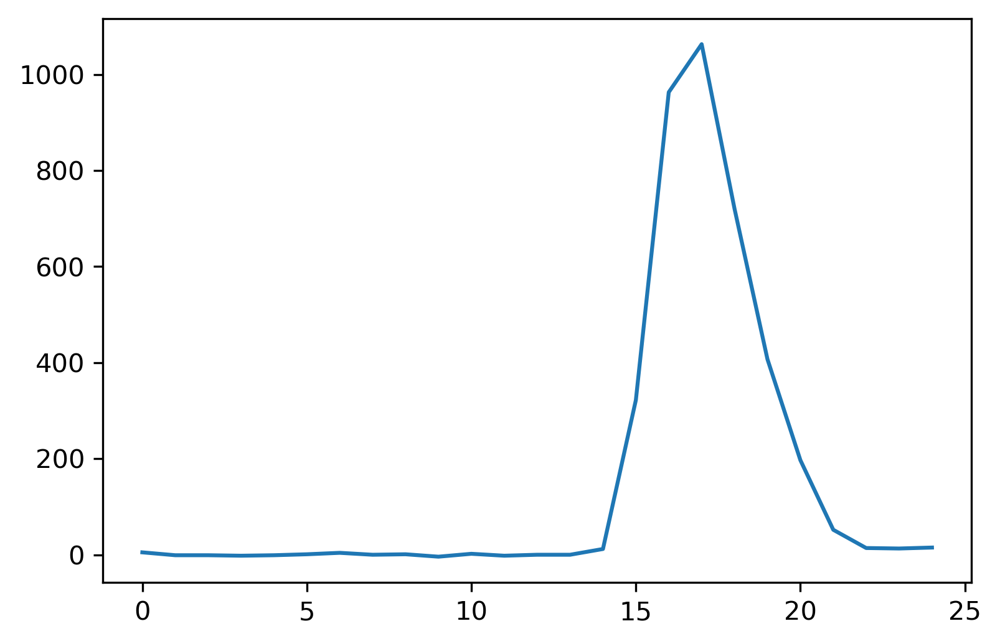

In [47]:
plt.plot(reset_zero(data[1][min_-10:max_], samp_size=5))

In [32]:
CFD

<function NE204_Functions.CFD(signal, frac, shift=500, pf=False, samp_size=500, save_name=None)>

In [ ]:
reset_zero(data[1][min_-10:max_], samp_size=5)

In [108]:
delay_signal

<function NE204_Functions.delay_signal(signal, delay=2000, samp_size=500, seed=69)>

In [113]:
data, sat = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5')

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

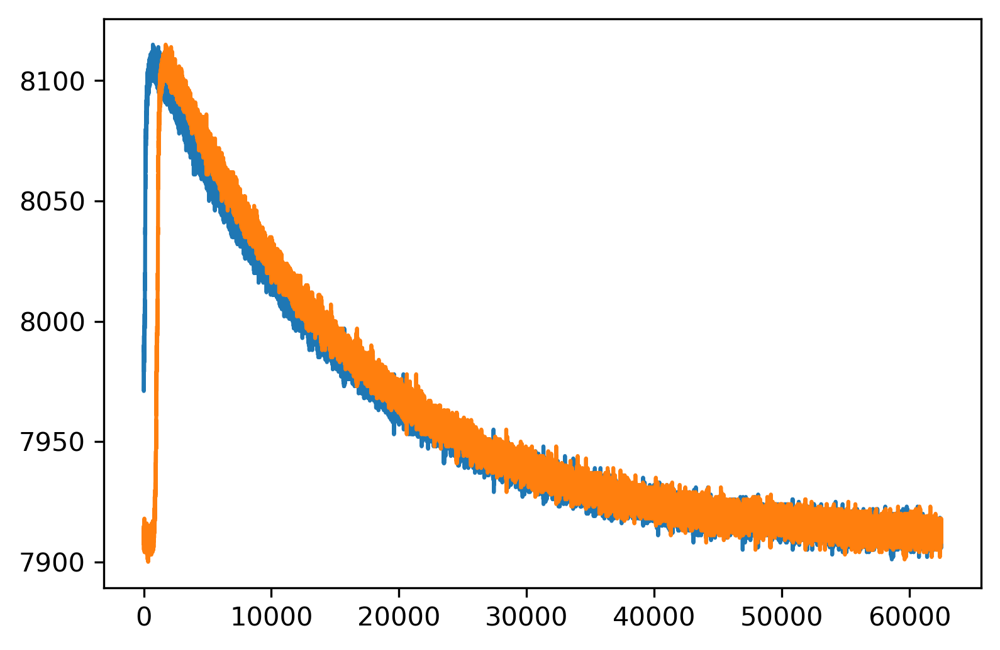

In [128]:
plt.plot(lengthen_signal(data[0], 1000)[1000:])
plt.plot(data[0])

In [118]:
len(data[0][len(data[0])-100:])

100

In [119]:
def lengthen_signal(signal, wait=2000, samp_size=500, seed=69):
    # Adds an artifcial delay on pulse to act like 3316 delay functionality
    np.random.seed(seed)
    noise_samp = signal[len(signal)-samp_size:]
    mean, std = np.mean(noise_samp), np.std(noise_samp)
    noise = np.random.normal(mean, 0.9*std, wait)
    return np.hstack([signal, noise])

In [140]:
def point_deconvolution(signal, p=3, tau=15000, samp_size=500, freq=250):
    # Based on DOI: 10.1088/0957-0233/19/6/065601
    # p is the number of points, 3, 4, 5
    X = 1/tau
    w1 = (1/X)*(np.exp((X-1)))
    w2 = (-2/X)*(np.exp(-1))
    w3 = (1/X)*(np.exp((-X-1)))
    
    v_k_m1 = delay_signal(signal, 1, samp_size=samp_size)[:-1]
    v_k_m2 = delay_signal(signal, 2, samp_size=samp_size)[:-2]
    v_k_p1 = lengthen_signal(signal, 1, samp_size=samp_size)[1:]
    v_k_p2 = lengthen_signal(signal, 2, samp_size=samp_size)[2:]
    
    if p == 3:
        return w1*signal + w2*v_k_m1 + w3*v_k_m2
    elif p == 4:
        return w1*v_k_p1 + (w1+w2)*signal + (w2+w3)*v_k_m1 + w3*v_k_m2

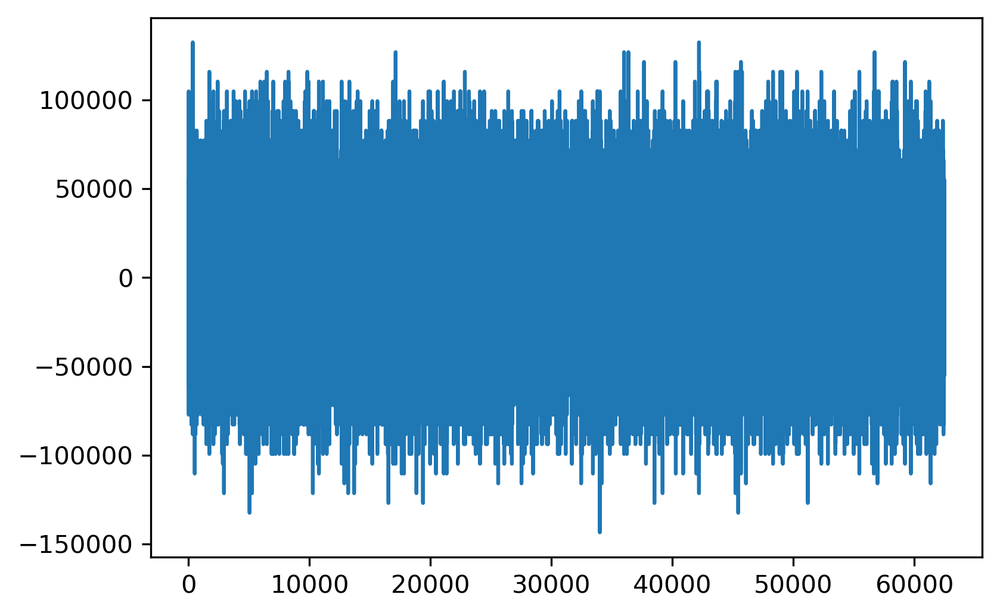

In [142]:
plt.plot(point_deconvolution(reset_zero(data[0])))

In [144]:
MWD

<function NE204_Functions.MWD(pulse, M, tau, samp_size=500)>

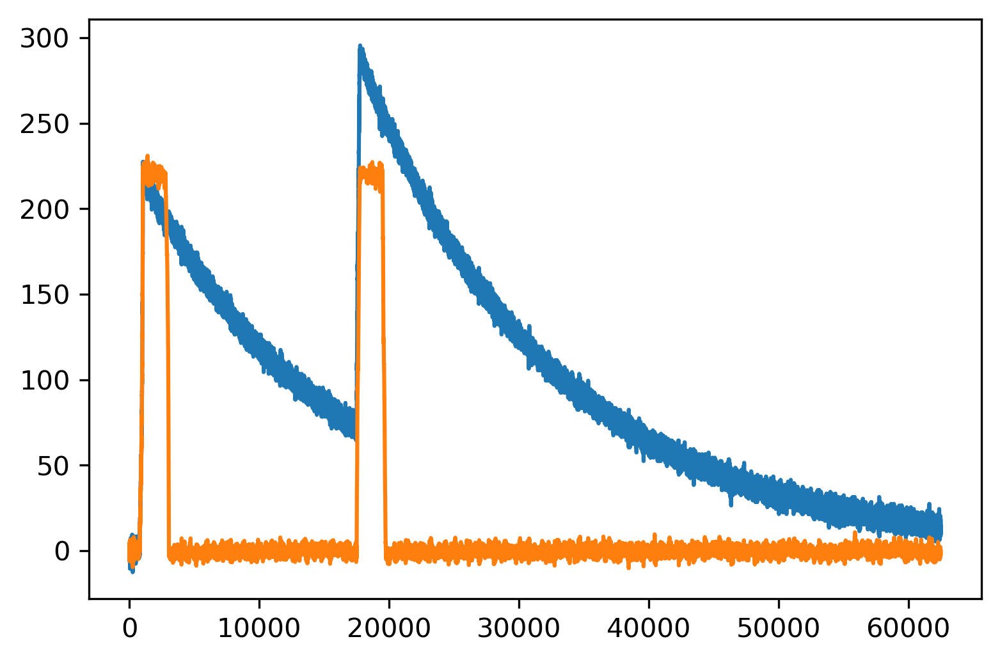

In [155]:
i = 1
plt.plot(reset_zero(data[i]))
plt.plot(MWD(savgol_filter(data[i], 27, 4), 2000, 15000))

In [139]:
4e-9/(60e-6)

6.666666666666667e-05

In [136]:
15000*4e-9

6e-05

## CLLBC Code

In [20]:
data_cf, sat_cf = import_data('Data/CLLBC/Combined_Data/CLLBC-Cf252-25cm-6.h5')
data_cs, sat_cs = import_data('Data/CLLBC/Combined_Data/CLLBC-Cs137-25cm-no-n-10.h5')

Checking for Saturation:   0%|          | 0/193591 [00:00<?, ?it/s]

Checking for Saturation:   0%|          | 0/102655 [00:00<?, ?it/s]

In [21]:
bad_inds_cf, bad_inds_cs = [], []

for p, pulse in enumerate(tqdm(data_cf)):
    if bad_signal_detector(pulse, bad_size=75):
        bad_inds_cf.append(p)
bad_inds_cf = np.concatenate([np.array(bad_inds_cf), sat_cf])

for p, pulse in enumerate(tqdm(data_cs)):
    if bad_signal_detector(pulse, bad_size=75):
        bad_inds_cs.append(p)
bad_inds_cs = np.concatenate([np.array(bad_inds_cs), sat_cs])

all_inds_cf, all_inds_cs = np.arange(len(data_cf)), np.arange(len(data_cs))

good_inds_cf = np.setdiff1d(all_inds_cf, bad_inds_cf)
good_inds_cs = np.setdiff1d(all_inds_cs, bad_inds_cs)

good_data_cf = data_cf[good_inds_cf]
good_data_cs = data_cs[good_inds_cs]

  0%|          | 0/193591 [00:00<?, ?it/s]

  0%|          | 0/102655 [00:00<?, ?it/s]

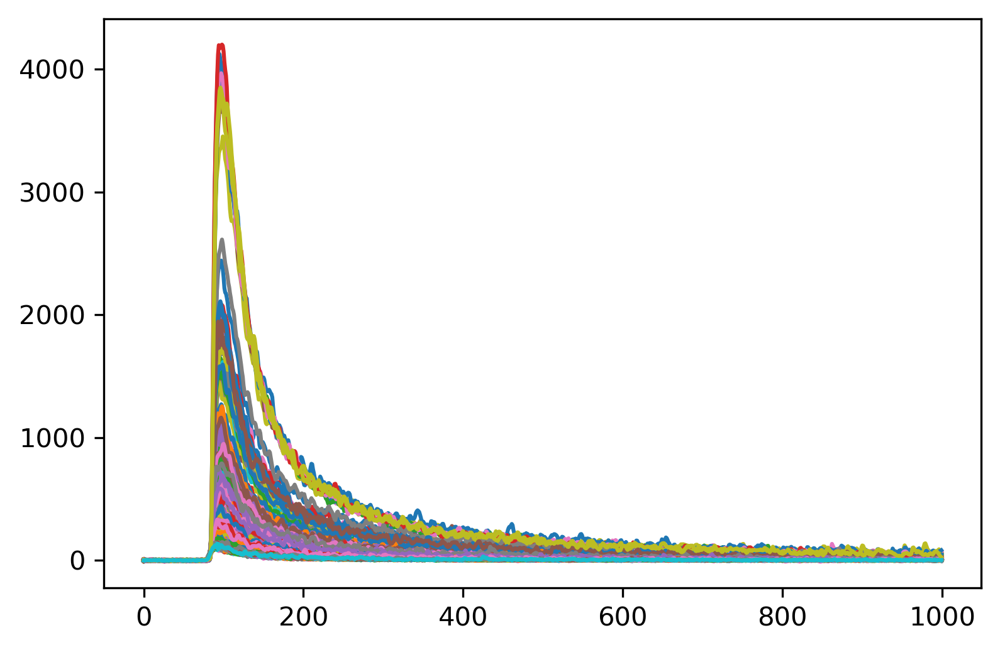

In [44]:
for i in range(500):
    plt.plot(reset_zero(good_data_cf[i], samp_size=50))

In [45]:
# Start value for CLLBC data: 70
# Stop value for CLLBC data: 400
def PSD(pulse, threshold, start, stop, samp_size=50):
    pulse_r = reset_zero(pulse, samp_size=samp_size)[:stop]
    
    total = np.sum(pulse_r[start:])
    
    tail = np.sum(pulse_r[start+threshold:])
    
    return tail, total

In [46]:
PSD(data_cf[0], 75, 74, 600)

(13248.299999999672, 24803.799999999617)

In [143]:
tails, totals = [], []
thresh = 70
CLLBC_start, CLLBC_stop = 74, 400
for pulse in tqdm(good_data_cs):
    tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
    tails.append(tail_temp)
    totals.append(total_temp)
tails, totals = np.array(tails), np.array(totals)
tail_total_ratio = tails/totals

  0%|          | 0/77120 [00:00<?, ?it/s]

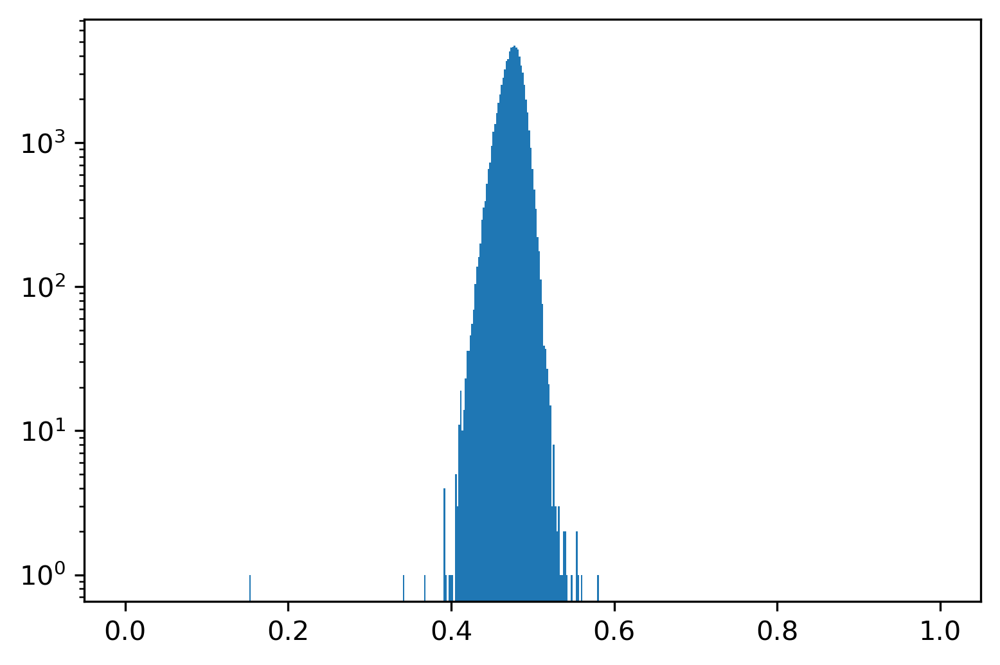

In [144]:
plt.hist(tail_total_ratio, bins=np.linspace(0, 1, 500))
plt.semilogy()
plt.show()

In [115]:
good_data_cf.shape

(152892, 1000)

In [118]:
np.max(good_data_cf, axis=1)

array([8478, 8352, 8351, ..., 8327, 8403, 8597], dtype=uint16)

In [137]:
test = good_data_cf[((np.max(good_data_cf, axis=1) >= 11700) & (np.max(good_data_cf, axis=1) <= 13000))]

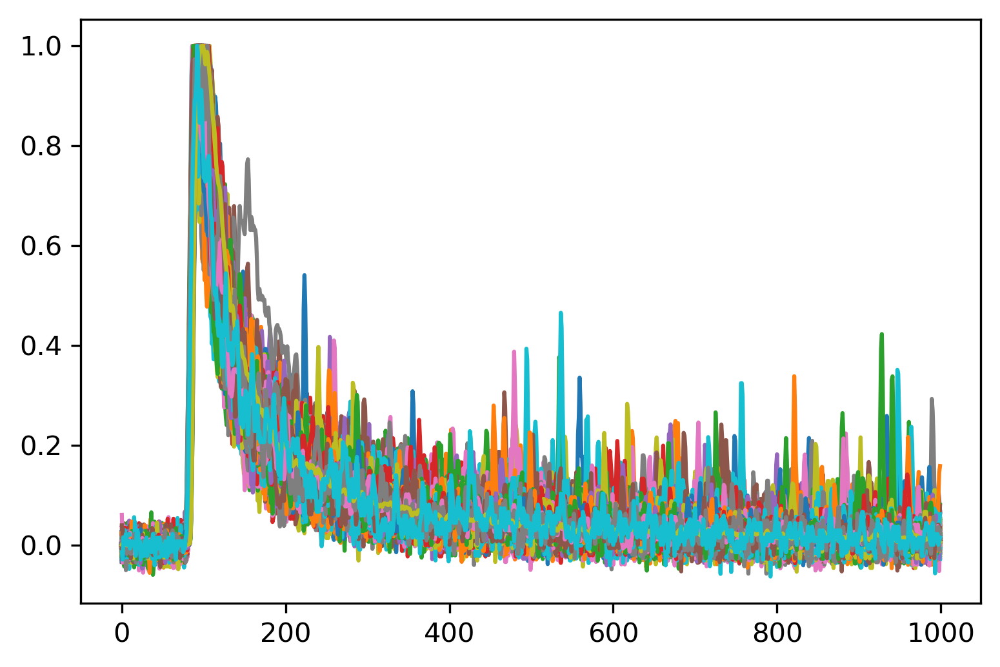

In [150]:
for i in range(500):
    plt.plot(reset_zero(good_data_cf[i], samp_size=50)/max(reset_zero(good_data_cf[i], samp_size=50)))

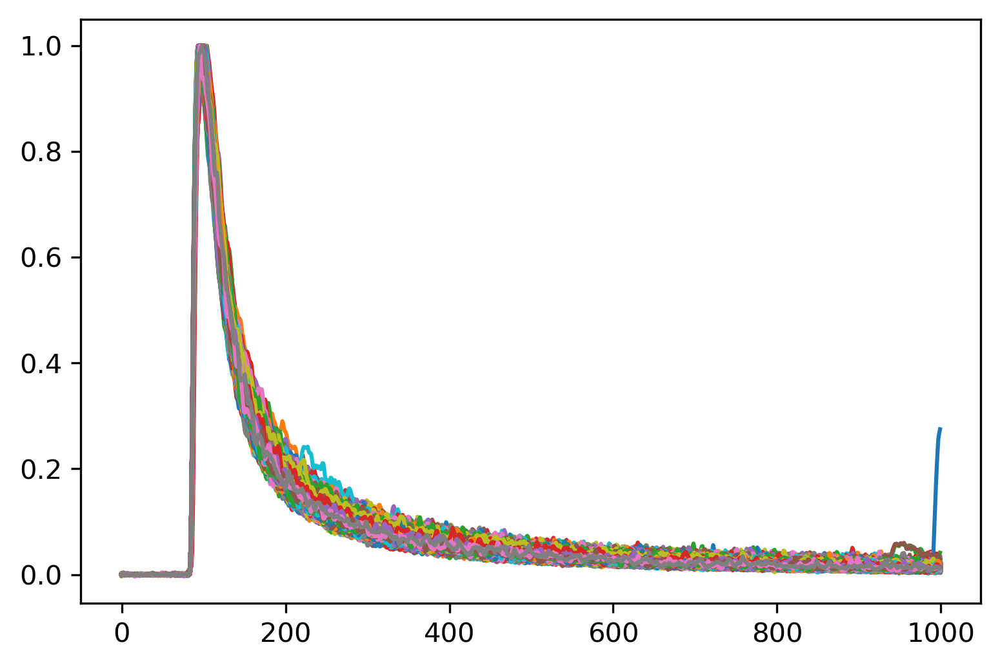

In [148]:
for i in range(len(test)):
    plt.plot(reset_zero(test[i], samp_size=50)/max(reset_zero(test[i], samp_size=50)))

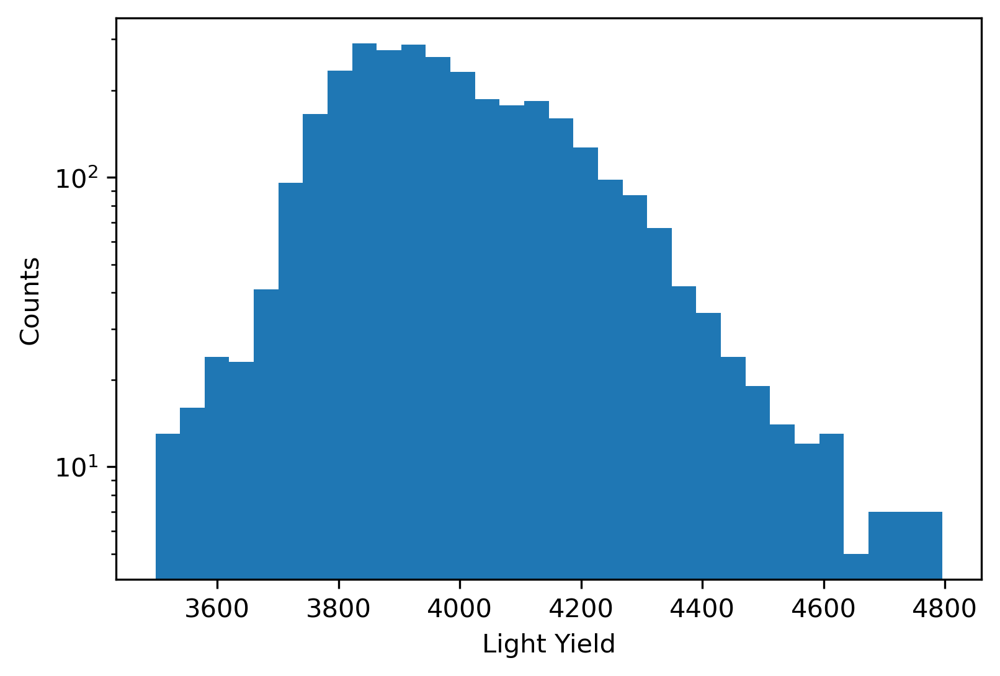

In [138]:
temp_enes = []
for pulse in test:
    if np.max(pulse) <= 13500:
        temp_enes.append(np.max(reset_zero(pulse, samp_size=50)))
temp_enes = np.array(temp_enes)

plt.hist(temp_enes, bins=2**5) #, alpha=0.5, color='green')
plt.xlabel('Light Yield')
plt.ylabel('Counts')
#plt.axvline(75, color='red')
plt.semilogy()
#plt.savefig('Plots/Cf252-Spectra.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

In [27]:
from matplotlib.colors import LogNorm

In [5]:
def gauss_new(x, A, x0, sigma):
    # Gaussian signal shape
    return A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))

  0%|          | 0/3228 [00:00<?, ?it/s]

Calculated FOM: 0.769242217482282


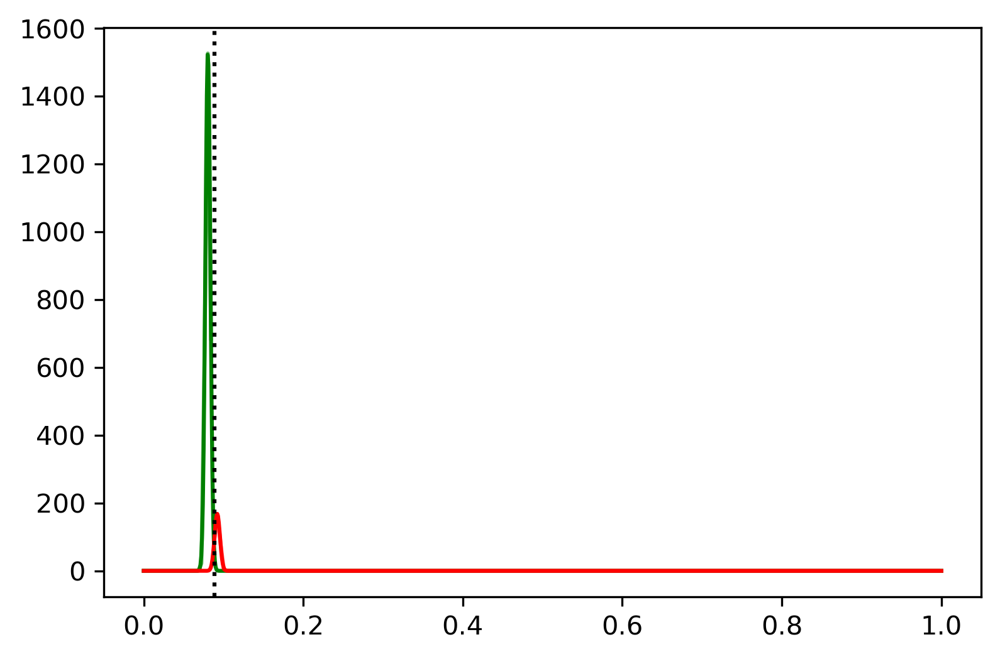

In [230]:
tails, totals, heights = [], [], []
thresh = 234
CLLBC_start, CLLBC_stop = 74, 400
for pulse in tqdm(test):
    tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
    tails.append(tail_temp)
    totals.append(total_temp)
    heights.append(np.max(pulse))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

counts, binsss, p = plt.hist(tail_total_ratio, bins=np.linspace(0, 1, 250))
plt.close()

#dh = savgol_filter(counts, 3, 0)
dh = counts

peaks, proms = find_peaks(dh, prominence=2)
first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

dip = np.argmin(dh[first:second])+first

fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))

print('Calculated FOM: {}'.format(fom))

x = np.linspace(0,1,1000)
plt.plot(x, gauss_new(x, *fit_gamma), color='green')
plt.plot(binsss[:dip], counts[:dip], color='green', alpha=0.5)

plt.plot(x, gauss_new(x, *fit_neutron), color='red')
plt.plot(binsss[dip:-1], counts[dip:], color='red', alpha=0.5)
#plt.axvline(first, color='red')
#plt.axvline(second, color='red')
plt.axvline(binsss[dip], color='black', linestyle=':')
plt.show()

  0%|          | 0/152892 [00:00<?, ?it/s]

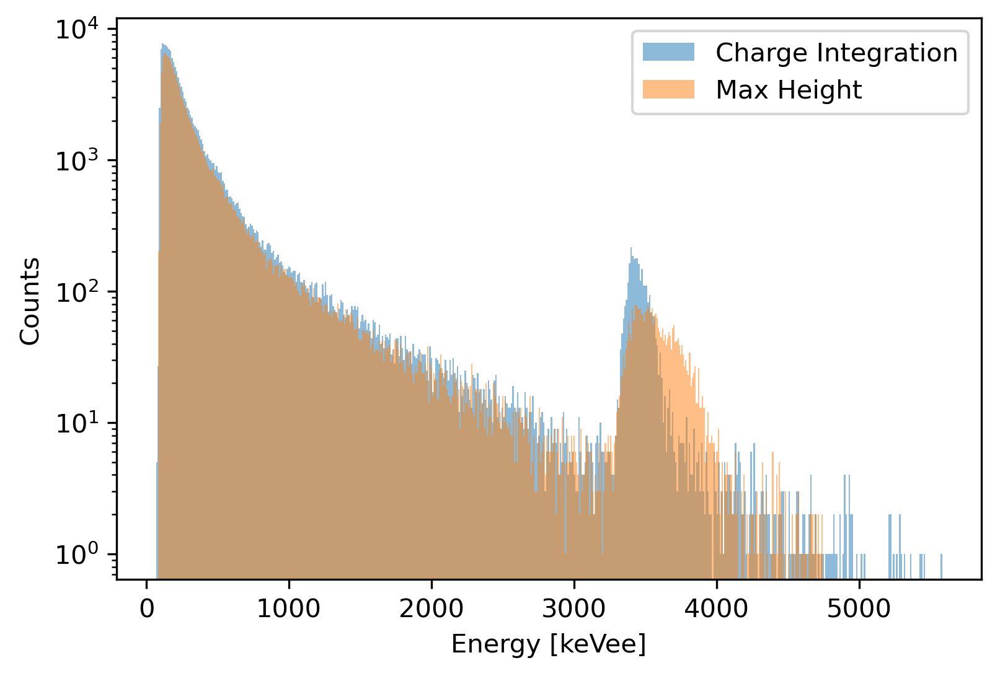

In [340]:
tails, totals, heights, ene_totals = [], [], [], []
thresh = 152
CLLBC_start, CLLBC_stop = 70, 400
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13500:
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        ene_totals.append((661.657/55636.434)*total_temp)
        heights.append((661.657/738.113)*np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights, ene_totals = np.array(tails), np.array(totals), np.array(heights), np.array(ene_totals)
tail_total_ratio = tails/totals

plt.hist(ene_totals, bins=2**9, alpha=0.5, label='Charge Integration')
plt.hist(heights, bins=2**9, alpha=0.5, label='Max Height')
plt.legend()
plt.semilogy()
plt.ylabel('Counts')
plt.xlabel('Energy [keVee]')
#plt.xlim(4.5e4, 6.5e4)
plt.show()

The centroid of the Cs-137 photopeak is at a "Light Yield" of: 55636.434


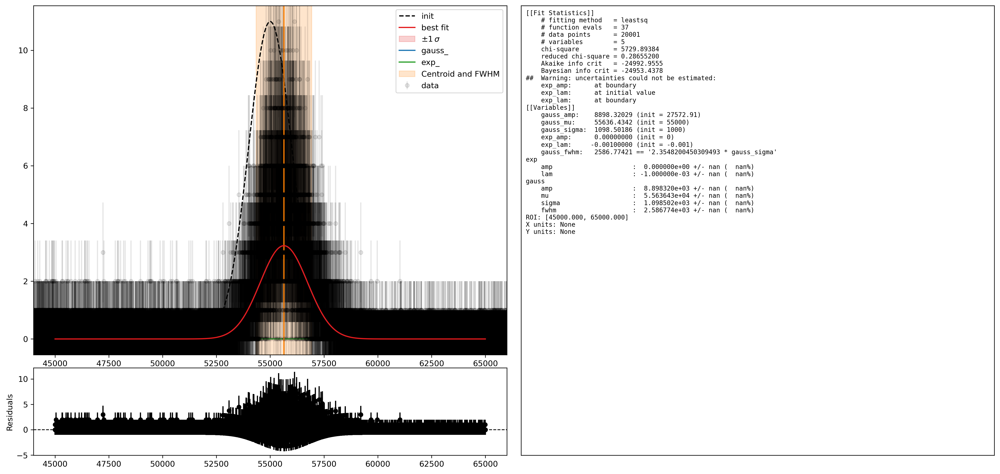

In [330]:
spec = bq.Spectrum.from_listmode(totals)

#model = (bq.fitting.GaussModel(prefix='gauss_') + bq.fitting.LineModel(prefix='linear_'))


fitter = bq.Fitter(
    ['gauss', 'exp'],
    x=spec.bin_indices,
    y=spec.counts_vals,
    y_unc=spec.counts_uncs,
    roi=(4.5e4, 6.5e4)
)

fitter.fit()

print('The centroid of the Cs-137 photopeak is at a "Light Yield" of: {}'.format(round(fitter.best_values['gauss_mu'], 3)))

fitter.custom_plot()
plt.show()

In [231]:
#pileup = np.argwhere(np.argmax(data_cf, axis=1)>100)[:,0]
CLLBC_start, CLLBC_stop = 74, 400
t_tot, t_tail, foms = [], [], []
threshes = np.arange(32, 233)
for thresh in tqdm(threshes):
    totals, tails = [], []
    for i in tqdm(range(len(test)), leave=False):
        tail_temp, total_temp = PSD(test[i], thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
    totals = np.array(totals)
    tails = np.array(tails)
    
    tail_total_ratio_temp = tails/totals
    
    counts, binsss, p = plt.hist(tail_total_ratio_temp, bins=np.linspace(0, 1, 250))
    plt.close()
    peaks, proms = find_peaks(counts, prominence=2)
    first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
    second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

    dip = np.argmin(counts[first:second])+first

    fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
    fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

    fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))
    
    t_tot.append(totals)
    t_tail.append(tails)
    
    foms.append(fom)
    
t_tot = np.array(t_tot)
t_tail = np.array(t_tail)
foms = np.array(foms)

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

  0%|          | 0/3228 [00:00<?, ?it/s]

The optimal threshold value is: 152


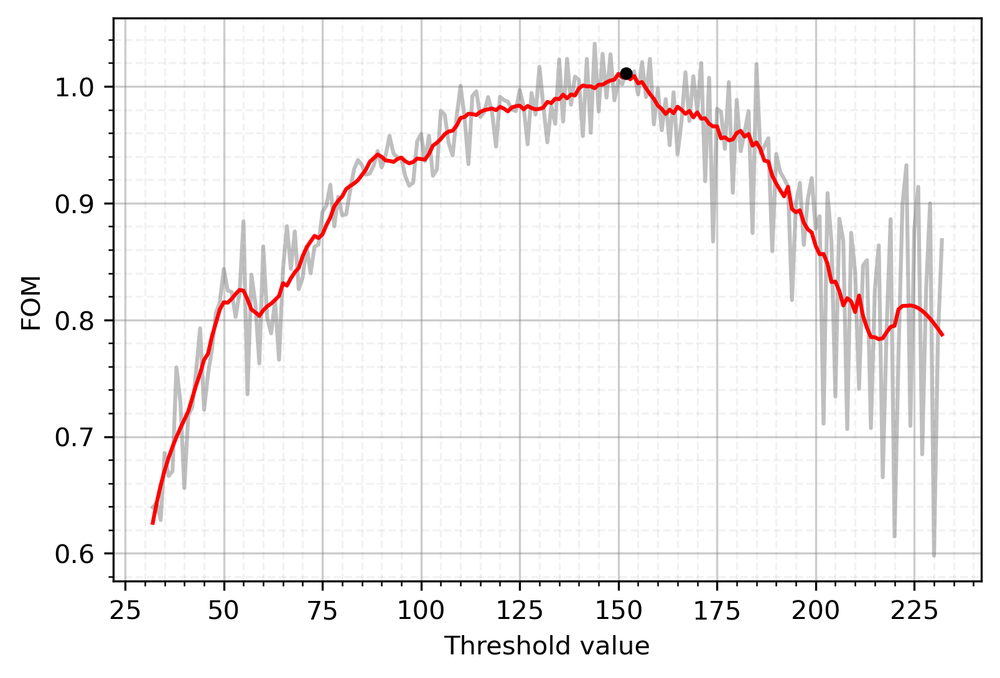

In [267]:
plt.plot(threshes, foms, color='grey', alpha=0.5)
plt.plot(threshes, savgol_filter(foms, 19, 3), color='red')
plt.scatter(threshes[np.argmax(savgol_filter(foms, 19, 3))], np.max(savgol_filter(foms, 19, 3)), 
            color='black', zorder=5, s=15)
plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.xlabel('Threshold value')
plt.ylabel('FOM')

print('The optimal threshold value is: {}'.format(threshes[np.argmax(savgol_filter(foms, 19, 3))]))
plt.show()

  0%|          | 0/77120 [00:00<?, ?it/s]

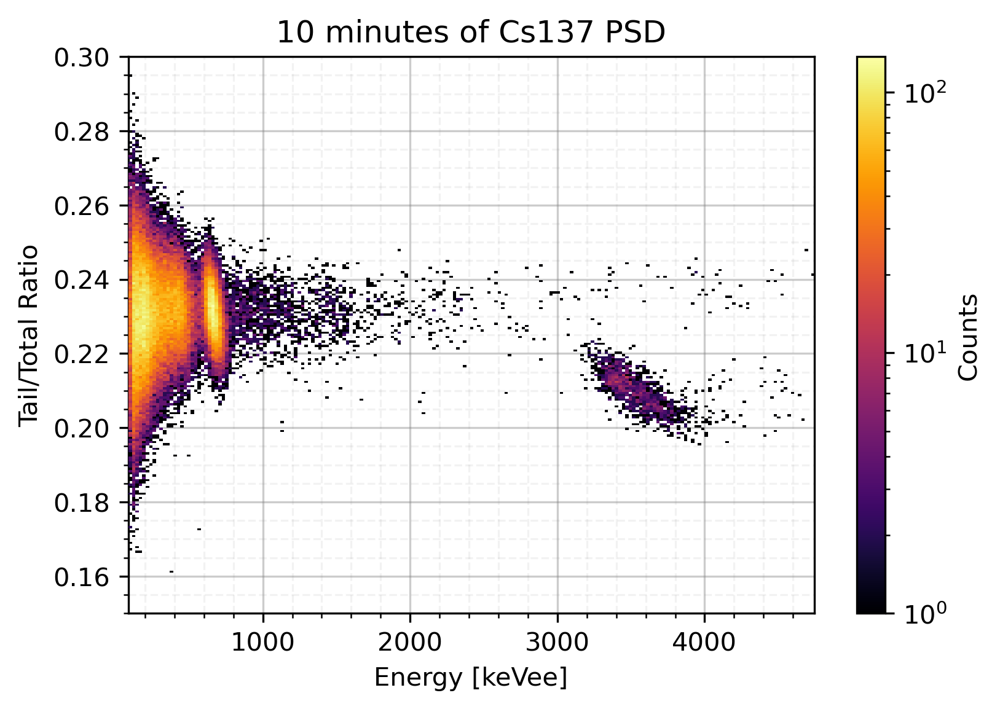

In [319]:
linear_calibration = (661.657/fitter.best_values['gauss_mu'])

tails, totals, heights = [], [], []
thresh = 152
CLLBC_start, CLLBC_stop = 70, 400
for pulse in tqdm(good_data_cs):
    if np.max(pulse) <= 13500:
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(linear_calibration*np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

#x_bins = np.linspace(0,3e4,1000)
min_x, max_x = np.min(heights), np.max(heights)
#min_y, max_y = np.min(tail_total_ratio), np.max(tail_total_ratio)
min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, heights, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee]')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('10 minutes of Cs137 PSD')
cbar = plt.colorbar(label='Counts')
plt.savefig('Plots/CLLBC_PSD_Cs137.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

  0%|          | 0/152892 [00:00<?, ?it/s]

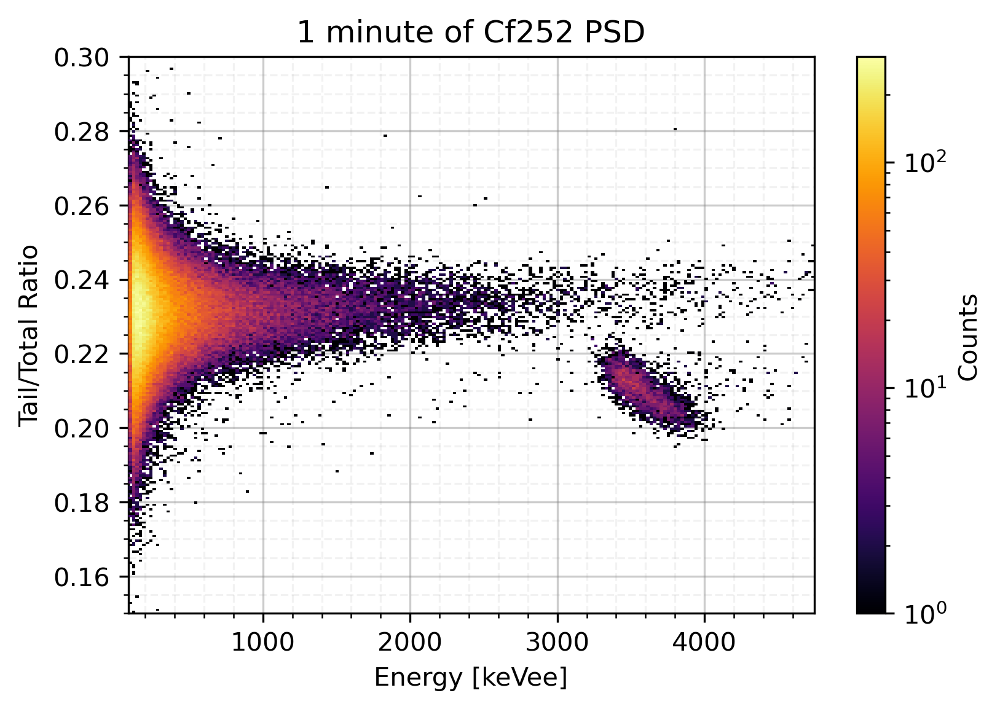

In [320]:
linear_calibration = (661.657/fitter.best_values['gauss_mu'])

tails, totals, heights = [], [], []
thresh = 152
CLLBC_start, CLLBC_stop = 70, 400
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13500:
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(linear_calibration*np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

#x_bins = np.linspace(0,3e4,1000)
min_x, max_x = np.min(heights), np.max(heights)
#min_y, max_y = np.min(tail_total_ratio), np.max(tail_total_ratio)
min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, heights, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee]')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('1 minute of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
plt.savefig('Plots/CLLBC_PSD_Cf252.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

  0%|          | 0/77125 [00:00<?, ?it/s]

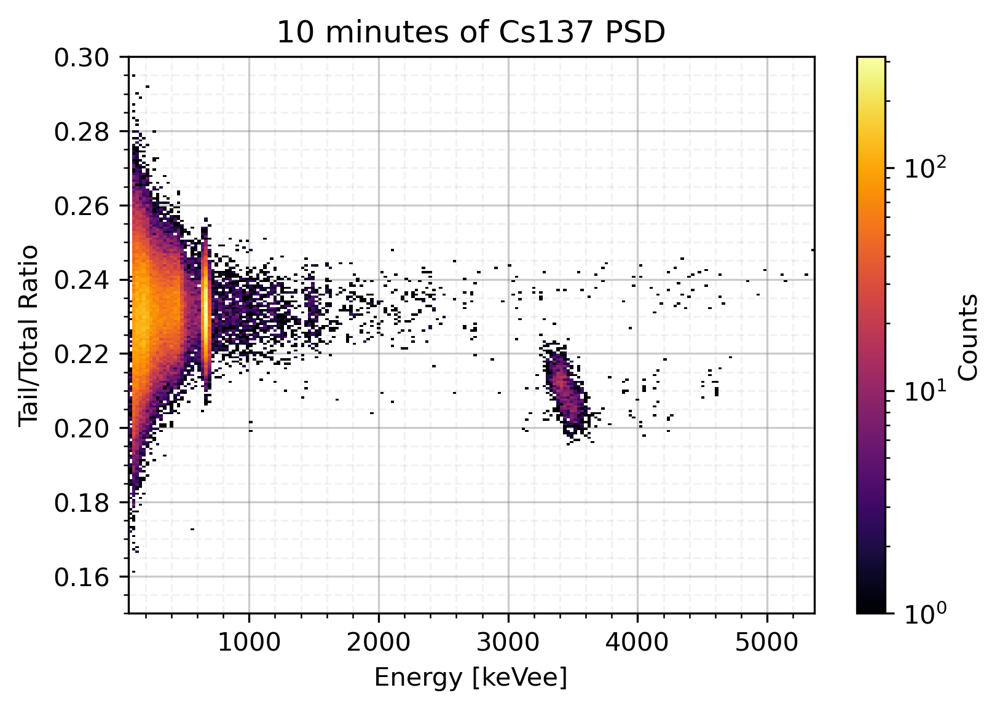

In [22]:
linear_calibration = (661.657/738.113)

tails, totals, heights = [], [], []
thresh = 152
CLLBC_start, CLLBC_stop = 70, 400
for pulse in tqdm(good_data_cs):
    if np.max(pulse) <= 13500:
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(linear_calibration*np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

#x_bins = np.linspace(0,3e4,1000)
min_x, max_x = np.min((661.657/55636.434)*totals), np.max((661.657/55636.434)*totals)
#min_y, max_y = np.min(tail_total_ratio), np.max(tail_total_ratio)
min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, (661.657/55636.434)*totals, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee]')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('10 minutes of Cs137 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

  0%|          | 0/152892 [00:00<?, ?it/s]

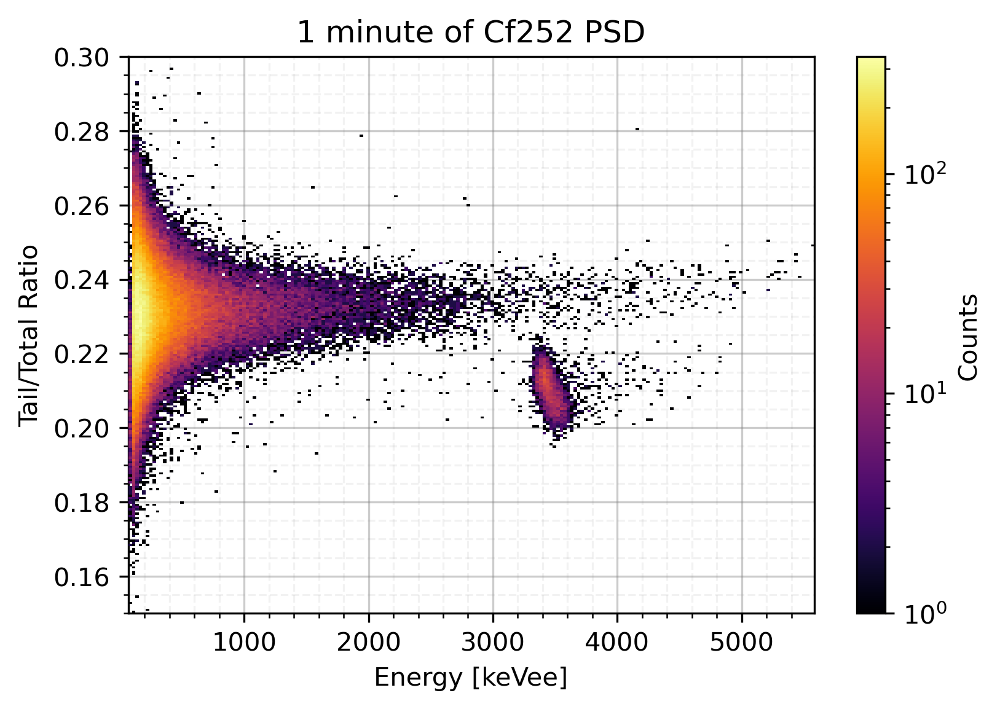

In [88]:
linear_calibration = (661.657/738.113)

tails, totals, heights = [], [], []
thresh = 152
CLLBC_start, CLLBC_stop = 70, 400
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13500:
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(linear_calibration*np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

#x_bins = np.linspace(0,3e4,1000)
min_x, max_x = np.min((661.657/55636.434)*totals), np.max((661.657/55636.434)*totals)
#min_y, max_y = np.min(tail_total_ratio), np.max(tail_total_ratio)
min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, (661.657/55636.434)*totals, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee]')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('1 minute of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

In [29]:
ds, heights, tails, totals = [], [], [], []
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13000:
        ds.append(calc_D(pulse, CLLBC_stop, b=3/4))
        tail_temp, total_temp = PSD(pulse, thresh, CLLBC_start, CLLBC_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(np.max(reset_zero(pulse, samp_size=50)))
ds, heights = np.array(ds), np.array(heights)
tails, totals = np.array(tails), np.array(totals)

  0%|          | 0/152947 [00:00<?, ?it/s]

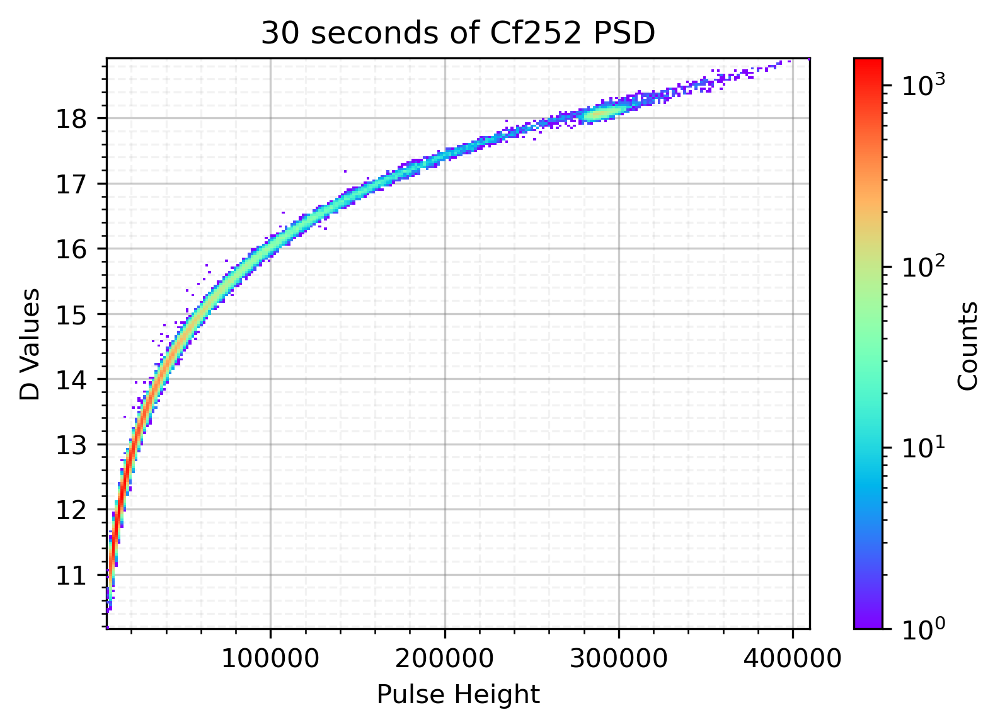

In [33]:
min_x, max_x = np.min(totals), np.max(totals)
min_y, max_y = np.min(ds), np.max(ds)
#min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,250)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(ds, totals, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='rainbow',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('D Values')
plt.xlabel('Pulse Height')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

## EJ-301

In [35]:
data_cf, sat_cf = import_data('Data/EJ-301/Combined_Data/EJ-301-Test-Cf252-3.h5')
data_cs, sat_cs = import_data('Data/EJ-301/Combined_Data/EJ-301-Test-Cs137-3_close.h5')

Checking for Saturation:   0%|          | 0/149629 [00:00<?, ?it/s]

Checking for Saturation:   0%|          | 0/12561 [00:00<?, ?it/s]

In [36]:
bad_inds_cf, bad_inds_cs = [], []

for p, pulse in enumerate(tqdm(data_cf)):
    if bad_signal_detector(pulse, bad_size=25):
        bad_inds_cf.append(p)
bad_inds_cf = np.concatenate([np.array(bad_inds_cf), sat_cf])

for p, pulse in enumerate(tqdm(data_cs)):
    if bad_signal_detector(pulse, bad_size=25):
        bad_inds_cs.append(p)
bad_inds_cs = np.concatenate([np.array(bad_inds_cs), sat_cs])

all_inds_cf, all_inds_cs = np.arange(len(data_cf)), np.arange(len(data_cs))

good_inds_cf = np.setdiff1d(all_inds_cf, bad_inds_cf)
good_inds_cs = np.setdiff1d(all_inds_cs, bad_inds_cs)

good_data_cf = data_cf[good_inds_cf]
good_data_cs = data_cs[good_inds_cs]

  0%|          | 0/149629 [00:00<?, ?it/s]

  0%|          | 0/12561 [00:00<?, ?it/s]

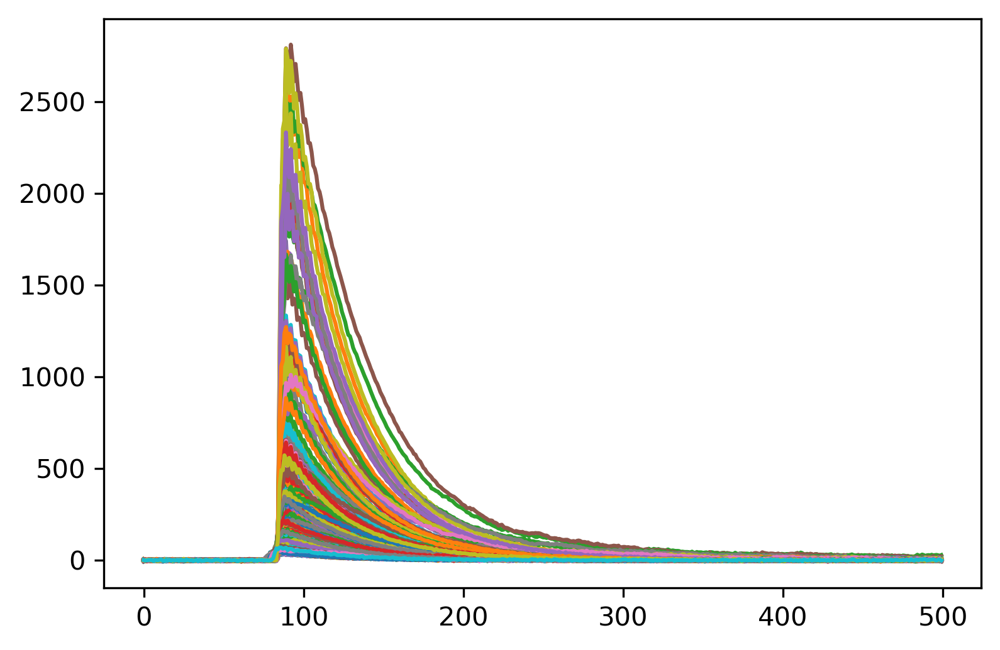

In [21]:
for i in range(500):
    plt.plot(reset_zero(good_data_cf[i], samp_size=50))

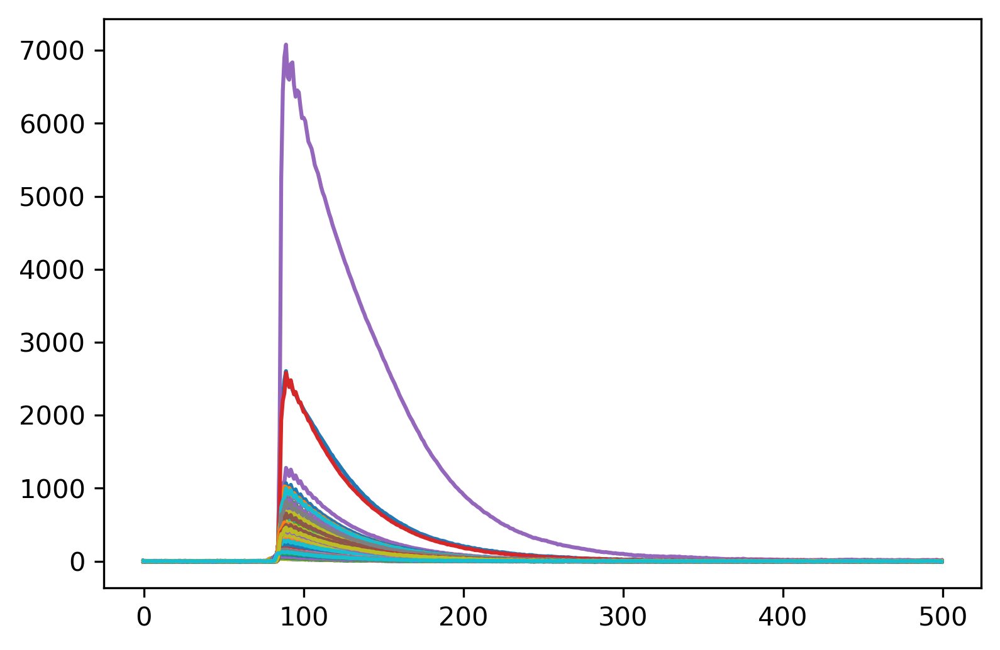

In [22]:
for i in range(500):
    plt.plot(reset_zero(good_data_cs[i], samp_size=50))

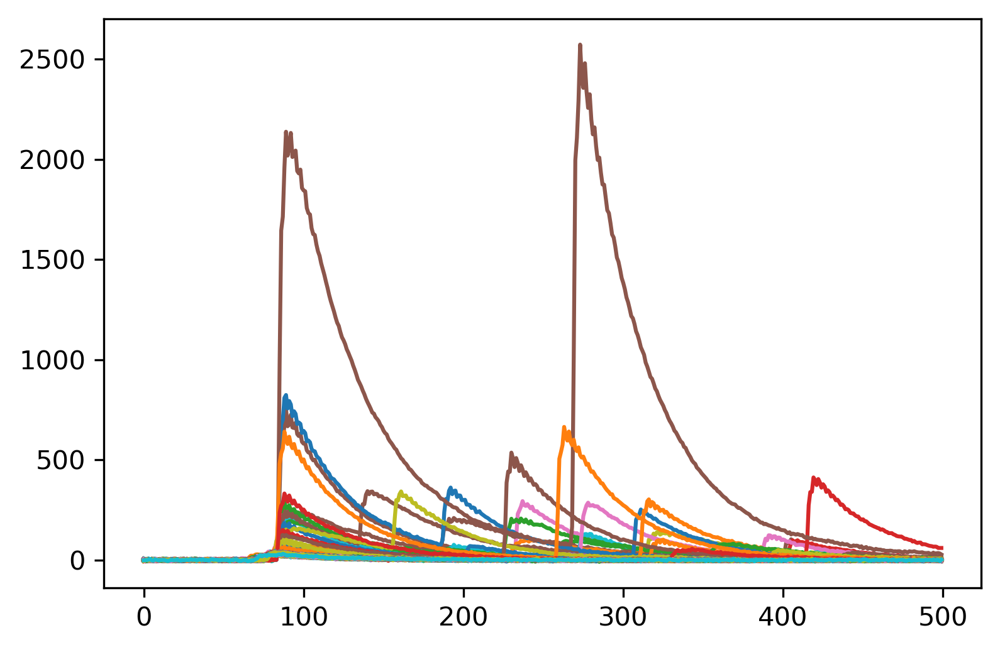

In [18]:
for i in range(500):
    plt.plot(reset_zero(data_cf[bad_inds_cf[i]], samp_size=50))

(75.0, 250.0)

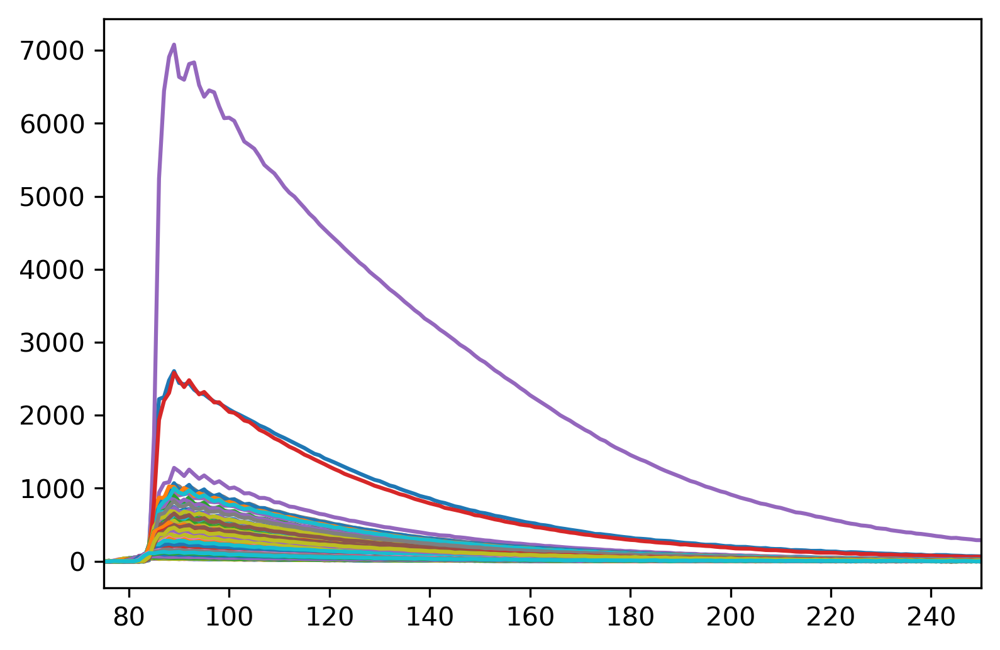

In [45]:
for i in range(500):
    plt.plot(reset_zero(good_data_cs[i], samp_size=50))
plt.xlim(75, 250)

In [17]:
len(bad_inds_cs)/len(data_cs)

0.08757264549000876

  0%|          | 0/131967 [00:00<?, ?it/s]

Calculated FOM: 1.0681156643936223


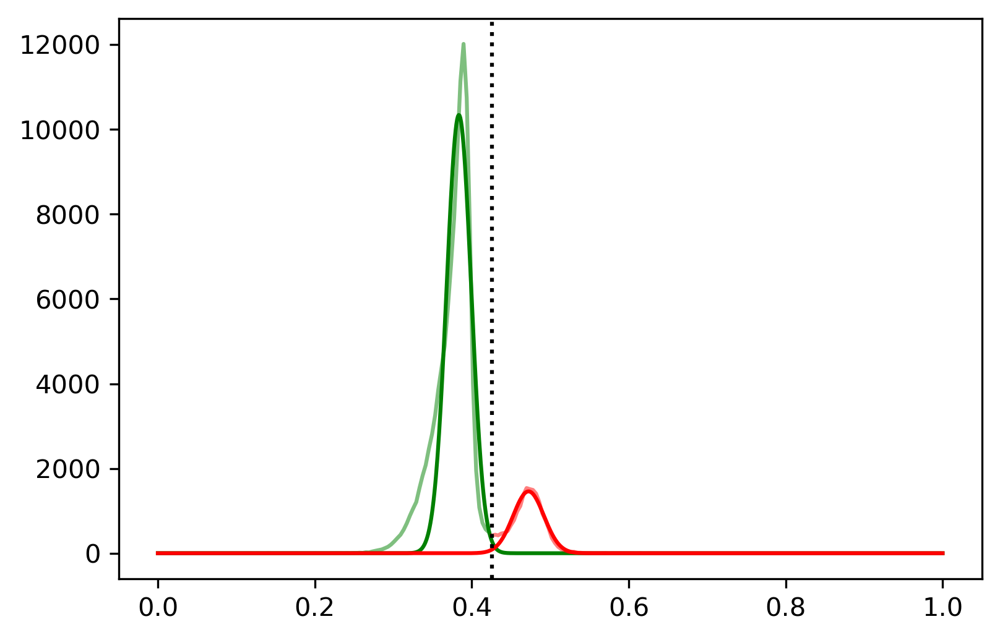

In [96]:
tails, totals, heights = [], [], []
thresh = 48
EJ301_start, EJ301_stop = 75, 250
for pulse in tqdm(good_data_cf):
    tail_temp, total_temp = PSD(pulse, thresh, EJ301_start, EJ301_stop)
    tails.append(tail_temp)
    totals.append(total_temp)
    heights.append(np.max(pulse))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

counts, binsss, p = plt.hist(tail_total_ratio, bins=np.linspace(0, 1, 250))
plt.close()

#dh = savgol_filter(counts, 3, 0)
dh = counts

peaks, proms = find_peaks(dh, prominence=2)
first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

dip = np.argmin(dh[first:second])+first

fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))

print('Calculated FOM: {}'.format(fom))

x = np.linspace(0,1,1000)
plt.plot(x, gauss_new(x, *fit_gamma), color='green')
plt.plot(binsss[:dip], counts[:dip], color='green', alpha=0.5)

plt.plot(x, gauss_new(x, *fit_neutron), color='red')
plt.plot(binsss[dip:-1], counts[dip:], color='red', alpha=0.5)
#plt.axvline(first, color='red')
#plt.axvline(second, color='red')
plt.axvline(binsss[dip], color='black', linestyle=':')
plt.show()

In [82]:
EJ301_start, EJ301_stop = 75, 250
t_tot, t_tail, foms = [], [], []
threshes = np.arange(18, 129)
for thresh in tqdm(threshes):
    totals, tails = [], []
    for i in tqdm(range(len(good_data_cf)), leave=False):
        tail_temp, total_temp = PSD(good_data_cf[i], thresh, EJ301_start, EJ301_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
    totals = np.array(totals)
    tails = np.array(tails)
    
    tail_total_ratio_temp = tails/totals
    
    counts, binsss, p = plt.hist(tail_total_ratio_temp, bins=np.linspace(0, 1, 250))
    plt.close()
    peaks, proms = find_peaks(counts, prominence=2)
    first = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-1])[0,0]]
    second = peaks[np.argwhere(proms['prominences']==np.sort(proms['prominences'])[-2])[0,0]]

    dip = np.argmin(counts[first:second])+first

    fit_gamma, cov_g = curve_fit(gauss_new, binsss[:dip], counts[:dip])
    fit_neutron, cov_n = curve_fit(gauss_new, binsss[dip:-1], counts[dip:])

    fom = np.abs(fit_gamma[1]-fit_neutron[1])/(2*np.sqrt(np.log(2)*2)*(np.abs(fit_gamma[2])+np.abs(fit_neutron[2])))
    
    t_tot.append(totals)
    t_tail.append(tails)
    
    foms.append(fom)
    
t_tot = np.array(t_tot)
t_tail = np.array(t_tail)
foms = np.array(foms)

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

  0%|          | 0/131967 [00:00<?, ?it/s]

The optimal threshold value is: 48


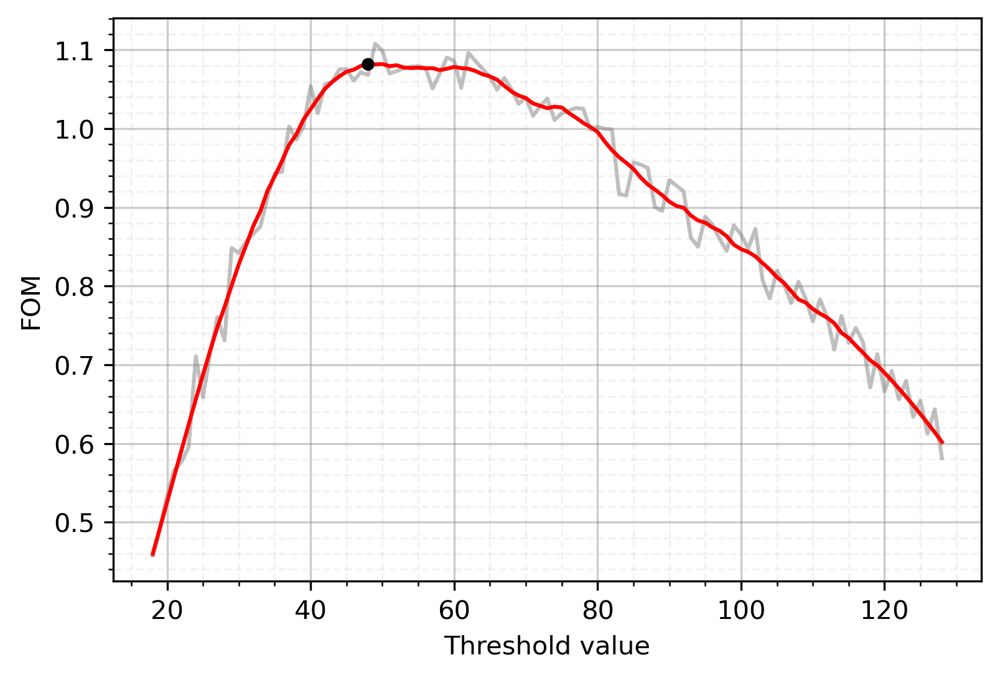

In [83]:
plt.plot(threshes, foms, color='grey', alpha=0.5)
plt.plot(threshes, savgol_filter(foms, 19, 3), color='red')
plt.scatter(threshes[np.argmax(savgol_filter(foms, 19, 3))], np.max(savgol_filter(foms, 19, 3)), 
            color='black', zorder=5, s=15)
plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.xlabel('Threshold value')
plt.ylabel('FOM')

print('The optimal threshold value is: {}'.format(threshes[np.argmax(savgol_filter(foms, 19, 3))]))
plt.show()

  0%|          | 0/11461 [00:00<?, ?it/s]

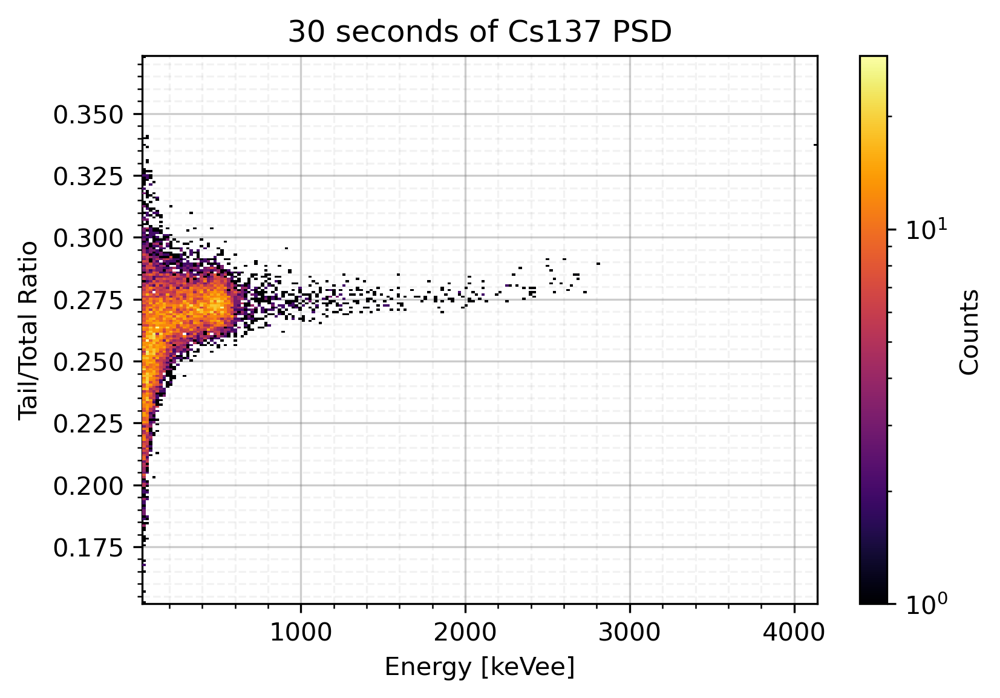

In [37]:
tails, totals, heights = [], [], []
thresh = 62
EJ301_start, EJ301_stop = 75, 250
for pulse in tqdm(good_data_cs):
    if np.max(pulse) <= 13000:
        tail_temp, total_temp = PSD(pulse, thresh, EJ301_start, EJ301_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

min_x, max_x = np.min(heights), np.max(heights)
min_y, max_y = max(0, np.min(tail_total_ratio)), np.max(tail_total_ratio)
#min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, heights, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee]')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cs137 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

  0%|          | 0/132008 [00:00<?, ?it/s]

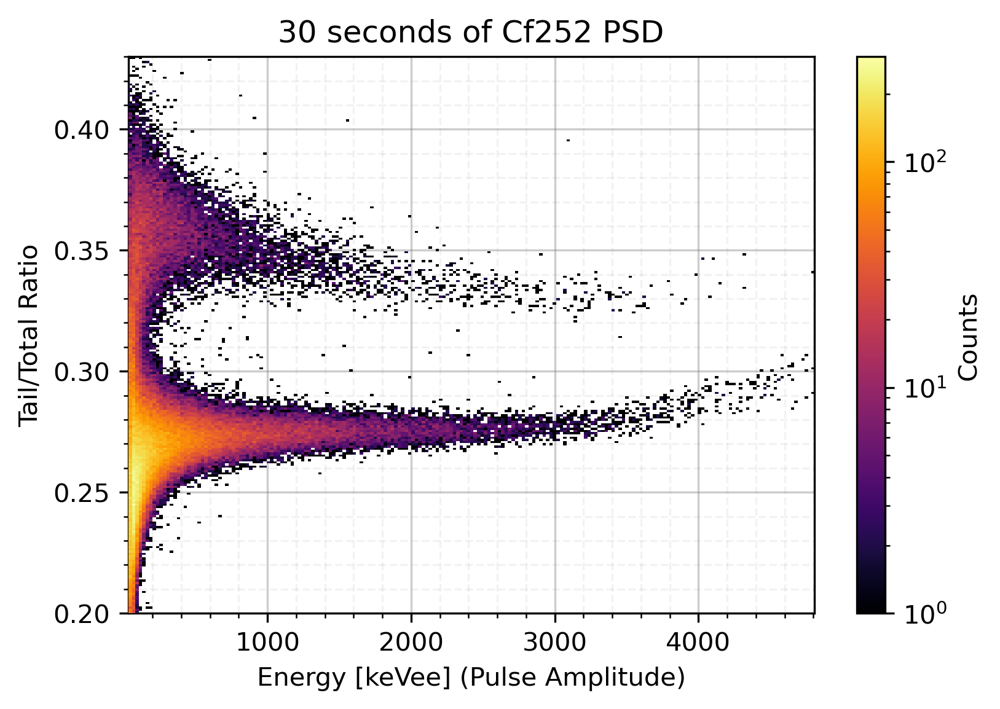

In [46]:
tails, totals, heights = [], [], []
thresh = 62
EJ301_start, EJ301_stop = 75, 250
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13000:
        tail_temp, total_temp = PSD(pulse, thresh, EJ301_start, EJ301_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

min_x, max_x = np.min(heights), np.max(heights)
#min_y, max_y = max(0, np.min(tail_total_ratio)), np.max(tail_total_ratio)
min_y, max_y = 0.2, 0.43
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, heights, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee] (Pulse Amplitude)')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

select energies above ceratin energy in the optimization, minimum energy of good separation

  0%|          | 0/132008 [00:00<?, ?it/s]

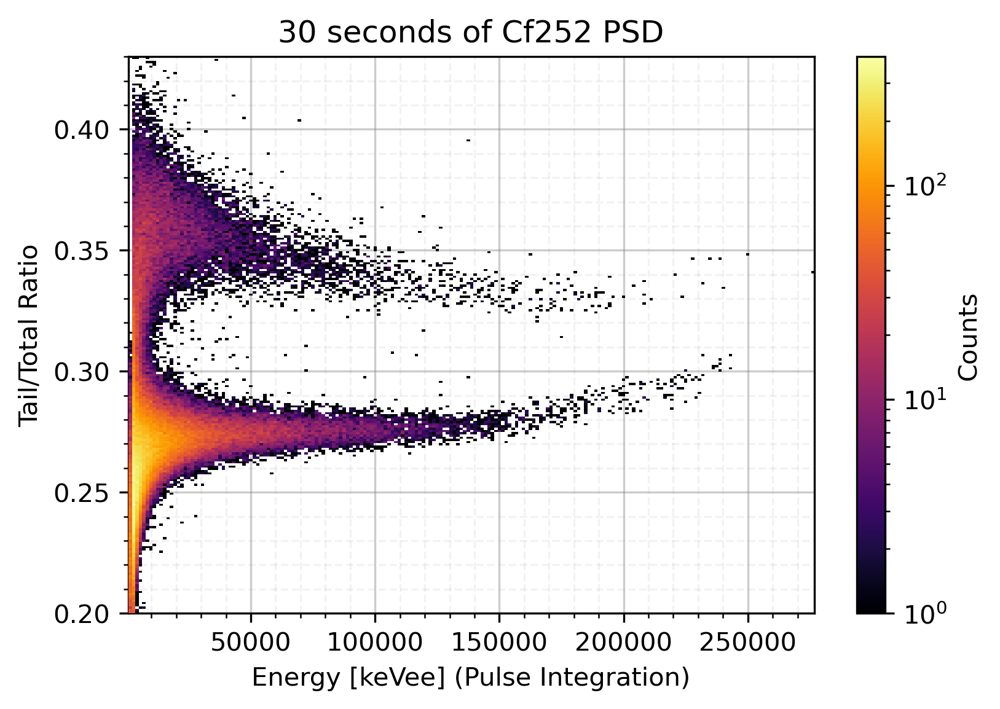

In [51]:
tails, totals, heights = [], [], []
thresh = 62
EJ301_start, EJ301_stop = 75, 250
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13000:
        tail_temp, total_temp = PSD(pulse, thresh, EJ301_start, EJ301_stop)
        tails.append(tail_temp)
        totals.append(total_temp)
        heights.append(np.max(reset_zero(pulse, samp_size=50)))
tails, totals, heights = np.array(tails), np.array(totals), np.array(heights)
tail_total_ratio = tails/totals

min_x, max_x = np.min(totals), np.max(totals)
#min_y, max_y = max(0, np.min(tail_total_ratio)), np.max(tail_total_ratio)
min_y, max_y = 0.2, 0.43
x_bins = np.linspace(min_x,max_x,200)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tail_total_ratio, totals, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='inferno',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tail/Total Ratio')
plt.xlabel('Energy [keVee] (Pulse Integration)')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

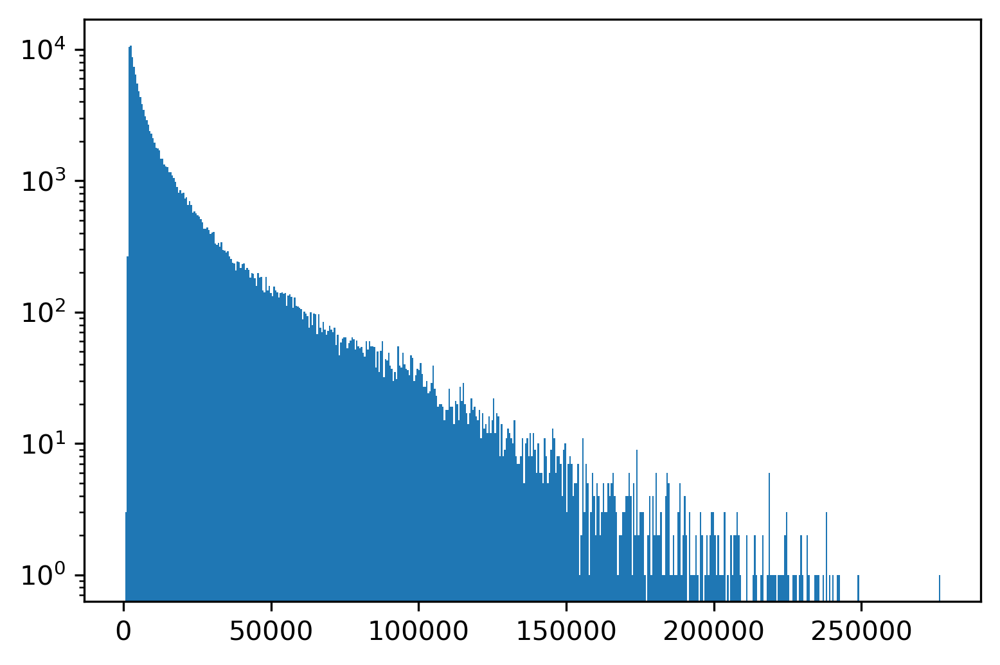

In [52]:
plt.hist(totals, bins=2**9)
plt.semilogy()
plt.show()

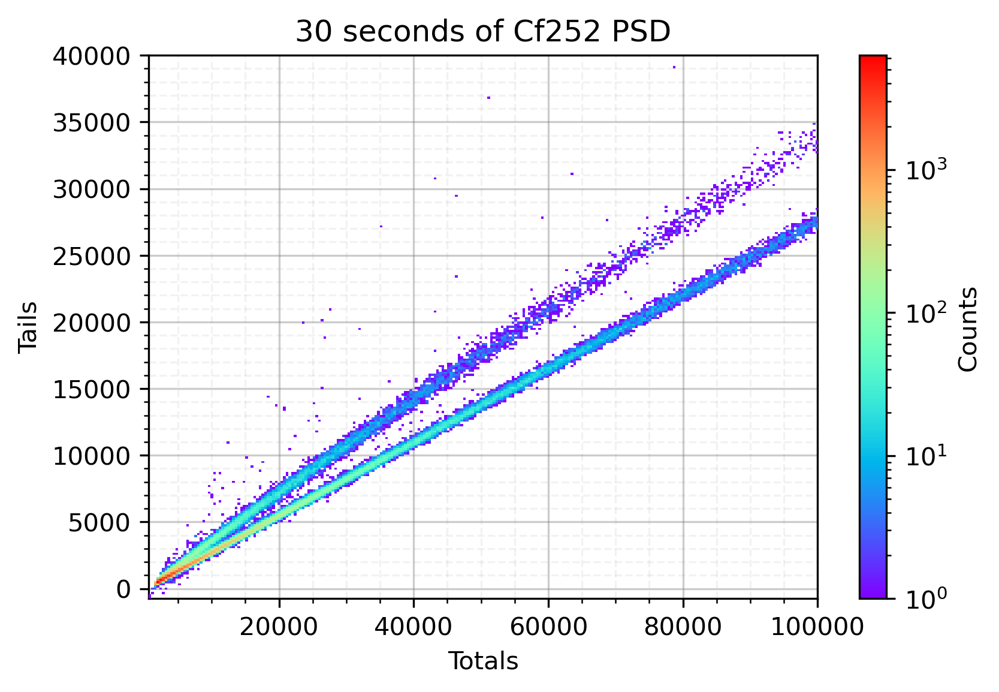

In [53]:
min_x, max_x = np.min(totals), 1e5
min_y, max_y = np.min(tails), 0.4e5
#min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,250)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(tails, totals, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='rainbow',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('Tails')
plt.xlabel('Totals')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

In [53]:
heights

array([165.8 ,  88.16, 438.2 , ...,  48.38,  76.18,  61.94])

In [138]:
math.floor(np.argmax(good_data_cf[10])+3/16*(250-np.argmax(good_data_cf[10])))

118

(75.0, 250.0)

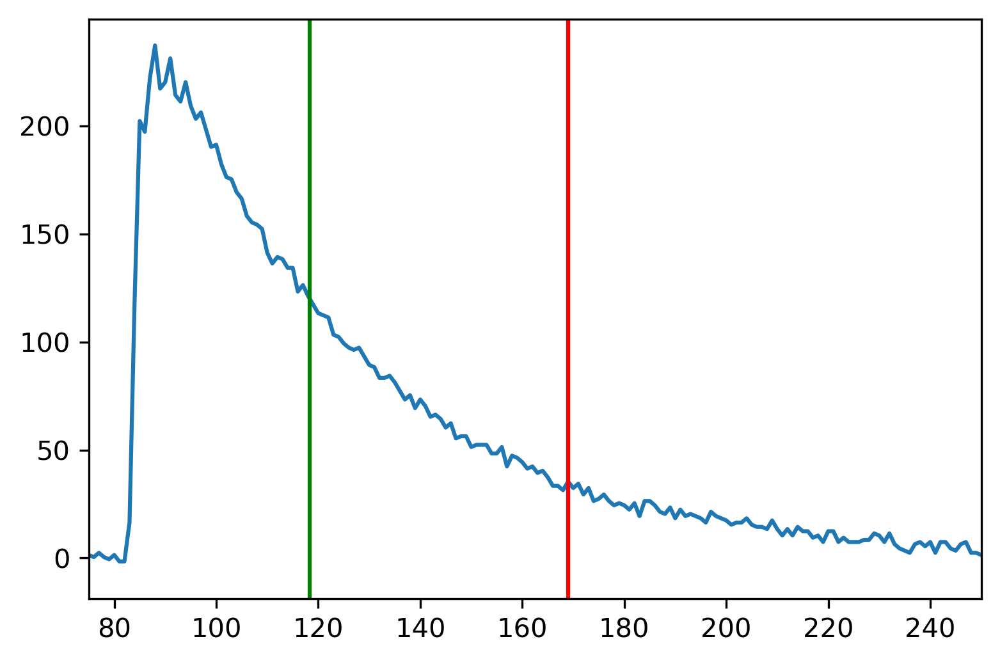

In [6]:
plt.plot(reset_zero(good_data_cf[10], samp_size=50))
plt.axvline(np.argmax(good_data_cf[10])+3/16*(250-np.argmax(good_data_cf[10])), color='green')
plt.axvline(np.argmax(good_data_cf[10])+1/2*(250-np.argmax(good_data_cf[10])), color='red')
plt.xlim(75,250)

In [28]:
def calc_D(pulse, stop, a=3/16, b=1/2, samp_size=50):
    # SDCC Method from DOI:10.1016/j.nima.2011.03.065
    # a = 3/16ths | b = 1/2
    pulse_r = reset_zero(pulse, samp_size=samp_size)[:stop]
    pulse_r = pulse_r[np.argmax(pulse_r):]
    
    a_ind = math.floor(a*(len(pulse_r)))
    b_ind = math.ceil(b*len(pulse_r))
    
    D = np.log(np.cumsum(np.square(pulse_r[a_ind:b_ind+1]))[-1])
    
    return D

In [18]:
ds, heights = [], []
for pulse in tqdm(good_data_cf):
    if np.max(pulse) <= 13000:
        ds.append(calc_D(pulse, EJ301_stop, b=3/4))
        heights.append(np.max(reset_zero(pulse, samp_size=50)))
ds, heights = np.array(ds), np.array(heights)

  0%|          | 0/132008 [00:00<?, ?it/s]

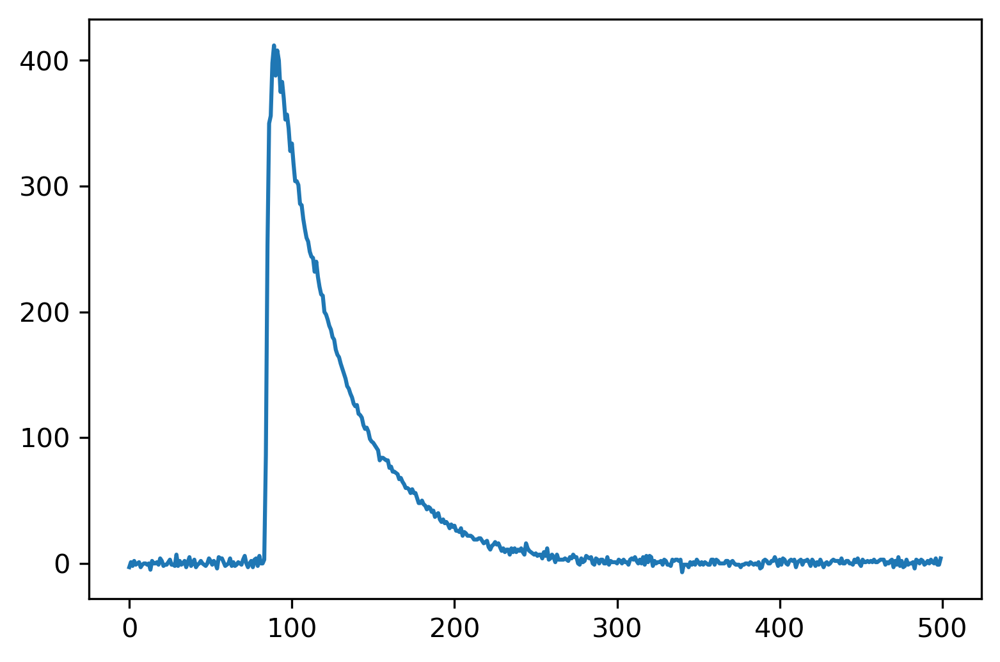

In [7]:
plt.plot(reset_zero(good_data_cf[2309], samp_size=50))

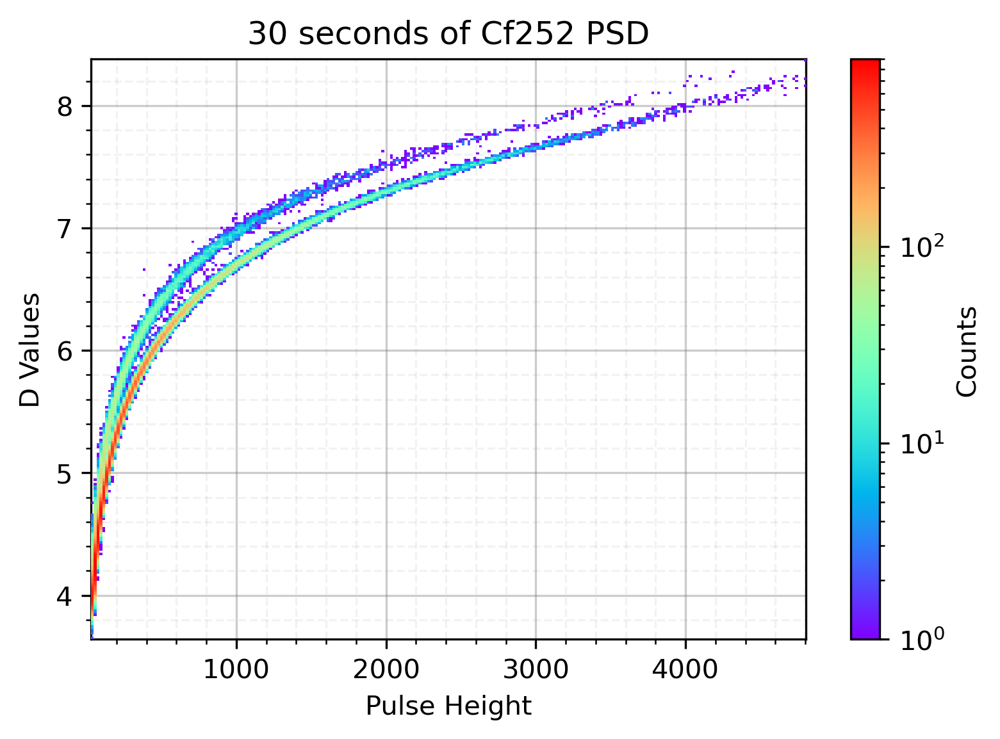

In [19]:
min_x, max_x = np.min(heights), np.max(heights)
min_y, max_y = np.min(ds), np.max(ds)
#min_y, max_y = 0.15, 0.3
x_bins = np.linspace(min_x,max_x,250)
y_bins = np.linspace(min_y,max_y,250)

psd_image = np.histogram2d(ds, heights, bins=[y_bins, x_bins])[0]
#plt.figure(figsize=[10,10])
plt.imshow(np.flipud(np.where(psd_image>0, psd_image, np.nan)), aspect='auto', cmap='rainbow',
          extent=(min_x,max_x,min_y,max_y), norm=LogNorm(vmin=1, vmax=np.max(psd_image)), zorder=5)
plt.ylabel('D Values')
plt.xlabel('Pulse Height')

plt.grid(which='major', color='grey', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='grey', linestyle='--', alpha=0.1)
plt.title('30 seconds of Cf252 PSD')
cbar = plt.colorbar(label='Counts')
#plt.savefig('Plots/CLLBC_PSD_Cf252_test.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()